# <p style="background-color:orange;font-family:newtimeroman;font-size:180%;color:black;text-align:center;border-radius:20px 20px;"><b>EDA Projesi - Google Play Store App </b></p>

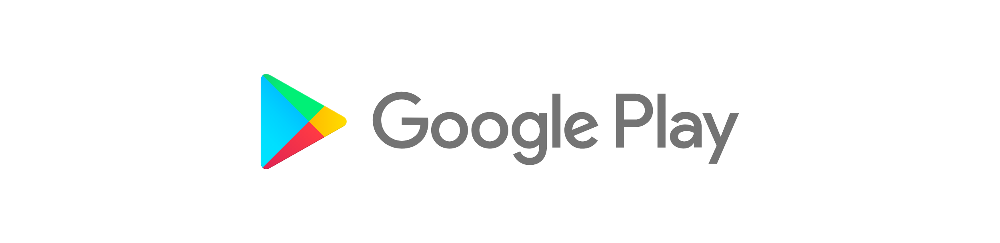

<b>Bu notebook ile Google Play Store App veri kümesi için EDA ve veri görselleştirmenin nasıl yapılacağı anlatılacaktır.</b>

<b>İçindekiler:</b>
<ul>
<li><a href="#import-library">Kütüphanelerin Yüklenmesi</a></li>
<li><a href="#loading-dataset">Veri Setinin Okutulması</a></li>
<li><a href="#understanding-dataset">Veri Setini Anlama - EDA</a></li>
<li><a href="#research-queries">Araştırma Sorguları ve Analitik Bilgiler</a></li>
</ul>

<a id='import-library'></a>
# **Kütüphanelerin Yüklenmesi**

In [7]:
# !pip install folium
# !pip install missingno

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import missingno as msno
import plotly.express as px
import folium
from folium import plugins

plt.rcParams["figure.figsize"] = (6,4)

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

<a id='loading-dataset'></a>
# **Veri Setinin Okutulması**

**Veri Seti İle İlgili**

İncelediğimiz dataset, Google Play Store'daki uygulamaların çeşitli özelliklerini içeren bir veri setidir. Toplam 10,841 satır ve 13 sütun içerir. 

<ul>
    <li><b>App:</b> Uygulamanın adı</li>
    <li><b>Category:</b> Uygulamanın kategorisi. Örnek kategoriler: ART_AND_DESIGN, FINANCE, COMICS, BEAUTY vb.</li>
    <li><b>Rating:</b> Kullanıcılar tarafından verilen ortalama puan (5 üzerinden)</li>
    <li><b>Reviews:</b> Kullanıcılar tarafından uygulamanın aldığı toplam yorum sayısı.</li>
    <li><b>Size:</b> Uygulamanın boyutu megabayt (MB) cinsinden</li>
    <li><b>Installs:</b> Uygulamanın Google Play'den kaç kez indirildiği bilgisi</li>
    <li><b>Type:</b> Uygulamanın ücretsiz mi yoksa ücretli mi olduğu bilgisi</li>
    <li><b>Price:</b> Uygulamanın fiyatı, Amerikan Doları (USD) cinsinden 0 ücretsiz demek</li>
    <li><b>Content Rating:</b> Uygulamanın içerik derecelendirmesi. Örneğin, "Everyone" herkes için uygun olduğunu gösterir.</li>
    <li><b>Genres:</b> Uygulamanın türü veya alt kategorileri. Örneğin, "Art-Design;Pretend Play" iki farklı türü gösterir.</li>
    <li><b>Last Updated:</b> Uygulamanın en son ne zaman güncellendiği. Örneğin, "January 7, 2018</li>
    <li><b>Current Ver:</b> Uygulamanın mevcut versiyonu. Örneğin, "1.0.0"</li>
    <li><b>Android Ver:</b> Uygulamanın çalıştırılabilmesi için gereken minimum Android versiyonu. Örneğin, "4.0.3 and up"</li>
</ul> 

In [11]:
df0 = pd.read_csv('googleplaystore.csv') 
df = df0.copy()

<a id='understanding-dataset'></a>
# **Veri Setini Anlama - EDA**

In [13]:
df.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


**Skimpy Kütüphanesi:**

Python'da veri setlerinin hızlı ve etkili bir şekilde özetlenmesi için kullanılan bir kütüphanedir. 

Sütun bazında temel istatistiklerini göstererek, veriyi anlamayı ve olası problemleri tespit etmeyi kolaylaştırır. 

Veri analistleri için büyük veri setlerini keşfetme ve incelemede zaman kazandıran basit bir çözüm sunar.

In [15]:
# pip install skimpy

In [16]:
from skimpy import skim

In [17]:
skim(df)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 10841  │ │ string      │ 12    │                                                          │
│ │ Number of columns │ 13     │ │ float64     │ 1     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━━━┓  │
│ ┃ column_name      ┃ NA     ┃ NA %   ┃ mean     ┃ sd        ┃ p0   ┃ p25   ┃ p50   ┃ p75   ┃ p100  ┃ hist    ┃  │
│ ┡━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━━━┩  │
│ │ Rating           │   1474 │   13.6 │    4.193 │    0.5374 │    1 │     4 │   4.3 │   4.5 │    19 │   ▂▇    │  │
│ └──────────────────┴────────┴────────┴──────────┴───────────┴──────┴───────┴───────┴───────┴───────┴─────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓  │
│ ┃ column_name                   ┃ NA     ┃ NA %       ┃ words per row               ┃ total words            ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩  │
│ │ App                           │      0 │          0 │                         3.9 │                  42584 │  │
│ │ Category                      │      0 │          0 │                           1 │                  10841 │  │
│ │ Reviews                       │      0 │          0 │                           1 │                  10841 │  │
│ │ Size                          │      0 │          0 │                         1.3 │                  14231 │  │
│ │ Installs                      │      0 │          0 │                           1 │                  10841 │  │
│ │ Type                          │      1 │       0.01 │                           1 │                  10840 │  │
│ │ Price                         │      0 │          0 │                           1 │                  10841 │  │
│ │ Content Rating                │      1 │       0.01 │                         1.1 │                  11759 │  │
│ │ Genres                        │      0 │          0 │                         1.4 │                  15450 │  │
│ │ Last Updated                  │      0 │          0 │                           3 │                  32521 │  │
│ │ Current Ver                   │      8 │       0.07 │                         1.3 │                  13929 │  │
│ │ Android Ver                   │      3 │       0.03 │                           3 │                  32514 │  │
│ └───────────────────────────────┴────────┴────────────┴─────────────────────────────┴────────────────────────┘  │
╰────────────────────────────────────────────────────── End ──────────────────────────────────────────────────────╯

**info() metodu,** DataFrame hakkında temel bilgileri sağlar. Bu metod, DataFrame'in yapısını hızlı bir şekilde anlamak için kullanışlıdır. 

- **RangeIndex:** İndeksleme hakkında bilgi, örneğin başlangıç, bitiş ve adım boyutu.
- **Data columns:** Tüm sütunların adları, kaç tane non-null (boş olmayan) değer olduğu ve veri tipi (dtype).
- **memory usage:** DataFrame'in hafızada ne kadar yer kapladığı.
- **dtypes:** Farklı veri tiplerinin (örneğin, integer, float, object vb.) kaç tane olduğu.

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10841 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10841 non-null  object 
 1   Category        10841 non-null  object 
 2   Rating          9367 non-null   float64
 3   Reviews         10841 non-null  object 
 4   Size            10841 non-null  object 
 5   Installs        10841 non-null  object 
 6   Type            10840 non-null  object 
 7   Price           10841 non-null  object 
 8   Content Rating  10840 non-null  object 
 9   Genres          10841 non-null  object 
 10  Last Updated    10841 non-null  object 
 11  Current Ver     10833 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(1), object(12)
memory usage: 1.1+ MB


**df.columns**, sütun adlarını döndüren bir özelliktir. Bu özellik kullanıldığında, DataFrame'deki sütunların isimlerini içeren bir liste elde edilir.

Column isimlerinde boşluk istenmez bu kapsamda bu boşlukları hep kullandığımız underscore (_) ile değiştirmeyi düşünmek uygun olur.

In [21]:
df.columns

Index(['App', 'Category', 'Rating', 'Reviews', 'Size', 'Installs', 'Type',
       'Price', 'Content Rating', 'Genres', 'Last Updated', 'Current Ver',
       'Android Ver'],
      dtype='object')

**.str.replace(" ", "_"):** Sütun adları içindeki boşlukları alt çizgi ile değiştirerek sütun adlarını yeniden biçimlendirir.

Daha kullanışlı ve işlenebilir sütun adları elde etmenize yardımcı olur. Bu, sütun adlarını tek bir düzende tutmak ve sütunlara daha kolay erişim sağlamak için yaygın bir uygulamadır.

In [23]:
df.columns = df.columns.str.replace(" ","_")

In [24]:
df.columns

Index(['App', 'Category', 'Rating', 'Reviews', 'Size', 'Installs', 'Type',
       'Price', 'Content_Rating', 'Genres', 'Last_Updated', 'Current_Ver',
       'Android_Ver'],
      dtype='object')

**df.shape,** boyut bilgilerini (satır ve sütun sayısı) döndüren bir özelliktir. 

Bu özellik kullanıldığında, dataframe in  kaç satır ve kaç sütundan oluştuğunu gösteren bir tuple elde edilir.

In [26]:
df.shape

(10841, 13)

**dtypes özelliği** her bir sütunun veri tipini (dtype) gösterir. 

Bu özellik, DataFrame'inizde hangi türde verilerin olduğunu hızlı bir şekilde anlamanıza yardımcı olur.

In [28]:
df.dtypes

App                object
Category           object
Rating            float64
Reviews            object
Size               object
Installs           object
Type               object
Price              object
Content_Rating     object
Genres             object
Last_Updated       object
Current_Ver        object
Android_Ver        object
dtype: object

**duplicated**

- **duplicated** fonksiyonu, bir **pandas DataFrame** içinde yinelenen satırları belirlemek için kullanılır. Bu fonksiyon, her bir satır için yinelenip yinelenmediğini gösteren boolean (True/False) değerler içeren bir **Series** döndürür.
- Fonksiyon, **keep** parametresi ile esneklik sağlar:
  - **keep=first** (default): İlk yinelenen dışındaki tüm yinelenenleri **True** olarak işaretler.
  - **keep=last**: Son yinelenen dışındaki tüm yinelenenleri **True** olarak işaretler.
  - **keep=False**: Tüm yinelenenleri **True** olarak işaretler.

In [30]:
df.duplicated().sum()

483

 **drop_duplicates**

- **drop_duplicates** fonksiyonu, **DataFrame'den yinelenen satırları kaldırmak** için kullanılır. Bu fonksiyon, yinelenen satırlar çıkarıldıktan sonra kalan DataFrame'i döndürür.
- Bu fonksiyon da **keep** parametresi ile kullanılabilir:
  - **keep=first** (default): İlk yinelenen hariç diğer tüm yinelenenleri kaldırır.
  - **keep=last**: Son yinelenen hariç diğer tüm yinelenenleri kaldırır.
  - **keep=False**: Tüm yinelenen satırları kaldırır, yani her bir benzersiz kombinasyon sadece bir kez görünür.
- **inplace** parametresi, değişikliklerin orijinal DataFrame üzerinde yerinde yapılıp yapılmayacağını belirler (**True** ise yerinde değişiklik yapar, **False** ise orijinal DataFrame'i değiştirmez ve sonucu yeni bir DataFrame olarak döndürür).

In [32]:
df = df.drop_duplicates()

In [33]:
pd.DataFrame({
    'Count': df.count(),
    'Null': df.isnull().sum(),
    'Cardinality': df.nunique()
})

,Count,Null,Cardinality
App,10358,0,9660
Category,10358,0,34
Rating,8893,1465,40
Reviews,10358,0,6002
Size,10358,0,462
Installs,10358,0,22
Type,10357,1,3
Price,10358,0,93
Content_Rating,10357,1,6
Genres,10358,0,120


**df.isnull().sum()** kodu, bir pandas DataFrame'de (df olarak adlandırılmış) her bir sütun için eksik (NaN veya None) değerlerin sayısını döndürür.

Bu kod, veri temizliği ve önişleme aşamalarında çok kullanışlıdır, çünkü eksik verilerin hangi sütunlarda olduğunu hızlı bir şekilde görmemizi sağlar.

In [35]:
df.isnull().sum()

App                  0
Category             0
Rating            1465
Reviews              0
Size                 0
Installs             0
Type                 1
Price                0
Content_Rating       1
Genres               0
Last_Updated         0
Current_Ver          8
Android_Ver          3
dtype: int64

**sns.set_theme():** Seaborn'un varsayılan tema ayarlarını kullanır. Bu, oluşturulan tüm grafiklerin bir tutarlı görünüme sahip olmasını sağlar.

**sns.set(rc={"figure.dpi":300, "figure.figsize":(12,9)}):** Bu satır, oluşturulan grafiklerin çözünürlüğünü ve boyutunu ayarlar.

**"figure.dpi": 300:** DPI (dots per inch) ayarını 300 olarak belirler, bu da grafiklerin daha yüksek çözünürlüklü olmasını sağlar.

**"figure.figsize": (12, 9):** Oluşturulan grafiklerin boyutunu 12x9 inç olarak ayarlar.

In [37]:
sns.set_theme()

sns.set(rc={"figure.dpi":300, "figure.figsize":(12,9)})

**sns.heatmap(df.isnull(), cbar=False)** kodu, bir DataFrame'de eksik verilerin (NaN veya None) nerede olduğunu görselleştirmek için bir heatmap oluşturur. 

cbar=False parametresi, renk çubuğunun (color bar) gösterilmemesini sağlar.

**Bu ısı haritasında:**

Eksik değerler, beyaz veya açık bir renkle gösterilir.

Diğer değerler, genellikle siyah veya koyu bir renkle gösterilir.

Bu görselleştirme, hangi sütunlarda ve satırlarda eksik verilerin yoğunlaştığını hızlıca görmek için oldukça kullanışlıdır. 

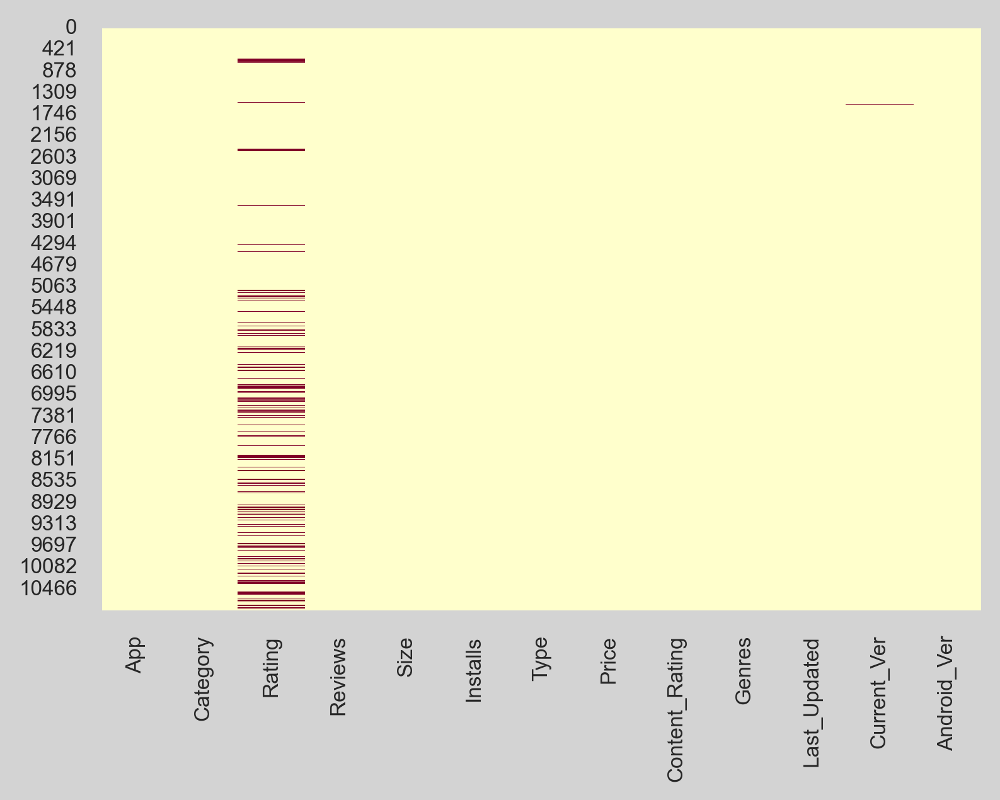

In [39]:
fig, ax = plt.subplots(figsize=(6, 4))  # 6x4 inç boyutunda bir figure oluştur
fig.patch.set_facecolor('lightgray')  # Genel arka plan rengi

ax.tick_params(axis='x', labelsize=8)  # X eksen etiketlerinin boyutu
ax.tick_params(axis='y', labelsize=8)  # Y eksen etiketlerinin boyutu

sns.heatmap(df.isnull(), cbar=False, cmap='YlOrRd');

**msno.bar(df);** kodu, missingno kütüphanesini (genellikle msno olarak kısaltılır) kullanarak veri setindeki eksik değerleri bar grafik şeklinde gösterir. 

Her bir bar, bir sütunu temsil eder ve barın yüksekliği, o sütundaki eksik olmayan değerlerin sayısını gösterir.

Bu tür bir görselleştirme, eksik verilerin hangi sütunlarda yoğunlaştığını hızlı bir şekilde anlamanıza yardımcı olabilir. 

Eksik verilerin olduğu sütunlar, veri temizleme veya önişleme aşamalarında özel dikkat gerektirebilir.

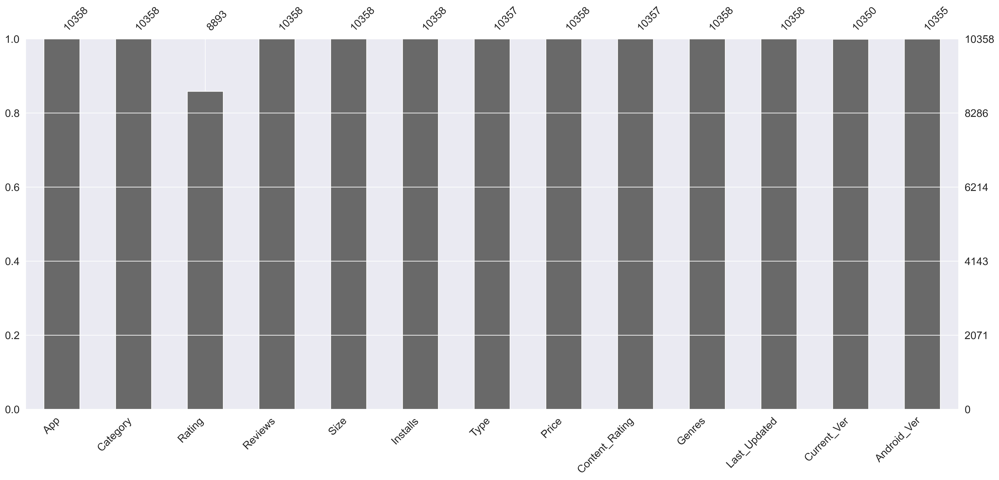

In [41]:
#bar chart olarak görmek için

msno.bar(df);

**Output Açıklaması**

**Yatay Eksen (X Ekseni):** Bu eksen, veri setindeki sütun isimlerini gösterir. Her bir sütun, bir bar ile temsil edilir.

**Dikey Eksen (Y Ekseni):** Bu eksen, her bir sütundaki eksik olmayan değerlerin sayısını gösterir. Eğer bir bar tamamen doluysa, bu o sütunda hiç eksik değer olmadığı anlamına gelir. Eğer bir bar tamamen dolu değilse, eksik değerler olduğu anlamına gelir.

**Barlar:** Her bir bar, bir sütunu temsil eder. Barın yüksekliği, o sütundaki eksik olmayan değerlerin sayısını gösterir. Barın rengi genellikle eksik olmayan değerlerin sayısını görselleştirmek için kullanılır. Tamamen dolu bir bar, o sütunda hiç eksik değer olmadığını gösterir.

**Barlar Üzerindeki Sayılar:** Her bir sütundaki eksik olmayan değerlerin tam sayısını gösterir.

**Grafiğin sağ dış tarafında yer alan sayılar:** Bu sayılar gözlem sayılarını rakamsal olarak göstermektedir.

**Grafiğin sol dış tarafında yer alan sayılar:** Bu sayılar gözlem sayılarını oransal olarak göstermektedir.

**msno.matrix(df);** missingno kütüphanesini kullanarak veri setindeki eksik değerleri bir matris grafiği şeklinde gösterir. 

Bu görselleştirme, veri setindeki eksik değerlerin yapısını anlamak için oldukça yararlıdır.

Bu tür bir görselleştirme, eksik değerlerin hangi sütunlarda ve satırlarda yoğunlaştığını, ayrıca eksik değerlerin veri seti boyunca nasıl dağıldığını görmek için oldukça yararlıdır.

Örneğin, eğer belirli bir sütunda çok fazla eksik değer varsa veya eksik değerler belirli bir desen gösteriyorsa, bu sütun veya desen üzerinde daha fazla çalışma yapmanız gerekebilir.

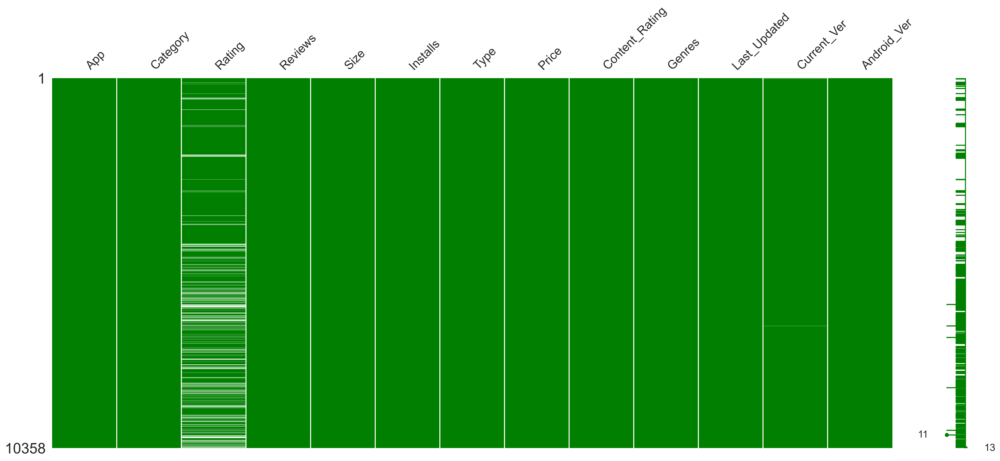

In [44]:
# Matrix chart olarak görmek için

msno.matrix(df, color=(0, 0.5, 0), fontsize=18, sparkline=True);

**Yatay Eksen (X Ekseni):** Bu eksen, veri setindeki sütun isimlerini gösterir. Her bir sütun, bir dizi nokta veya çizgi ile temsil edilir.

**Dikey Eksen (Y Ekseni):** Bu eksen, veri setindeki satır indekslerini gösterir. Her bir satır, yatay eksende belirtilen sütunlardaki değerlerin var olup olmadığına göre bir dizi nokta veya çizgi ile temsil edilir.

**Noktalar ve Çizgiler:** Eğer bir değer eksikse, o nokta beyaz olarak gösterilir; eğer değer eksik değilse, o nokta gri veya siyah olarak gösterilir (burada color kulalndıımız için mavi). Bu sayede, hangi sütunlarda ve satırlarda eksik değerlerin olduğunu görebilirsiniz.

**color=(0, 0, 1):** Bu parametre, eksik değerleri göstermek için kullanılacak rengi belirtir. Burada (0, 0, 1) mavi rengi temsil eder. Bu, RGB renk kodlamasında Kırmızı=0, Yeşil=0, Mavi=1 anlamına gelir. Dolayısıyla, eksik veri noktaları mavi olarak gösterilecektir.

**Sparkline-Sağ Taraftaki Bar (nullity bar):** Bu, veri setinin her satırında eksik değerlerin dağılımını ve yoğunluğunu özetleyen bir grafiktir. Sparkline'ın üst ve alt kısmındaki boşluklar, veri setinde eksik değer içermeyen satırları temsil eder. Sparkline'daki doldurulmuş kısımlar ise eksik verilere sahip satırları gösterir. Sparkline'ın tepesinde ve tabanında kalan boşluk ne kadar azsa, o kadar çok eksik değere sahip satır vardır.

In [46]:
df.isnull().sum()

App                  0
Category             0
Rating            1465
Reviews              0
Size                 0
Installs             0
Type                 1
Price                0
Content_Rating       1
Genres               0
Last_Updated         0
Current_Ver          8
Android_Ver          3
dtype: int64

- Yukardaki görseller ile Rating sütununda çok fazla eksik veri var olduğunu gördük.

- Eksik değerler, genellikle "NaN" (Not a Number) olarak temsil edilir ve veri çerçevesindeki bu eksik değerlere sahip satırlar, analiz veya model eğitimi sırasında istenmeyen sonuçlara neden olabilir. 

- Bu nedenle eksik değerlere sahip satırları kaldırmak, veri setinin temizlenmesine yardımcı olabilir.

- Bu eksik verilerle mücadele etmenin bir çok yolu var hatta bu makine öğrenmesi için önemli bir alan. Bu alan ayrı bir iş alanı olarak bilinmektedir. 

- Bu sütun için missing value yani eksik veriler için sık kullanılan bir yöntem olan median ile doldurma seçeneğini kullanacağım. Median değeri, veri setinin ortasında yer alan değerdir ve aykırı değerlerden genellikle etkilenmez.

- Eksik verileri doldururken ortalama kullanmadan önce datada mevcut aykırı değerleri her zaman akılda bulundurmak gerekir. 

- Aykırı değerlerin fazla olduğu data setinde ortalama tercihi yanlış olabilir. Ortalama değeri, veri setindeki aykırı değerlerden kolaylıkla etkilenebilir. 

- Bu nedenle, eğer veri setinizde aykırı değerler varsa ve bu değerlerin eksik verilerin doldurulmasında etkili olmasını istemiyorsanız, medyan kullanmak daha iyi bir seçenek olabilir. 

- Medyan, aykırı değerlere karşı daha "dirençli" olduğu için, bu tür durumlar için genellikle daha uygun bir seçenektir.

**rating_median = df["Rating"].median():** Bu satır, "Rating" adlı sütundaki verilerin ortanca (median) değerini hesaplar ve bu değeri "rating_median" adlı bir değişkene atar. Ortanca, veri setinin sıralandığında ortada bulunan değerdir ve veri setindeki değerlerin yarıdan fazlasını temsil eder.

In [49]:
rating_median = df["Rating"].median()
rating_median

4.3

**df["Rating"].fillna(rating_median, inplace=True):** Bu satır, "Rating" sütunundaki eksik değerleri ("NaN" olarak temsil edilir) "rating_median" değeri ile doldurur. fillna işlevi, belirtilen sütundaki eksik değerleri doldurmak için kullanılır. inplace=True parametresi, bu değişikliğin veri çerçevesine doğrudan uygulanmasını sağlar, yani yeni bir veri çerçevesi oluşturmak yerine mevcut veri üzerinde değişikliği sabit kılar.

In [51]:
df["Rating"].fillna(rating_median, inplace=True)

# df["Rating"].fillna(df["Rating"].median(), inplace=True)

Diğer sütunlarda daha az sayıda eksiklik olduğundan bunları düşürmekte sakınca görmüyorum.

**dropna():** Eksik değerlere sahip olan satırları (gözlemleri) kaldırmak için kullanılır.

**inplace=True:** "True" olarak ayarlandığında, işlem data frame üzerinde yaptığımız değişiklikleri kalıcı hale getirir.

In [54]:
df.dropna(inplace=True)

**sum():** Bu, "True" değerlerin sayısını toplar. Yani, her sütun için eksik değerlerin sayısını hesaplar.

**İkinci sum():** İlk sum() işlemi sonucunda hesaplanan her sütun için eksik değerlerin sayısını toplar. Böylece, veri çerçevesindeki tüm eksik değerlerin toplam sayısını verir.

In [56]:
df.isnull().sum().sum()

0

In [57]:
df

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content_Rating,Genres,Last_Updated,Current_Ver,Android_Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up
5,Paper flowers instructions,ART_AND_DESIGN,4.4,167,5.6M,"50,000+",Free,0,Everyone,Art & Design,"March 26, 2017",1.0,2.3 and up
6,Smoke Effect Photo Maker - Smoke Editor,ART_AND_DESIGN,3.8,178,19M,"50,000+",Free,0,Everyone,Art & Design,"April 26, 2018",1.1,4.0.3 and up
7,Infinite Painter,ART_AND_DESIGN,4.1,36815,29M,"1,000,000+",Free,0,Everyone,Art & Design,"June 14, 2018",6.1.61.1,4.2 and up
8,Garden Coloring Book,ART_AND_DESIGN,4.4,13791,33M,"1,000,000+",Free,0,Everyone,Art & Design,"September 20, 2017",2.9.2,3.0 and up
9,Kids Paint Free - Drawing Fun,ART_AND_DESIGN,4.7,121,3.1M,"10,000+",Free,0,Everyone,Art & Design;Creativity,"July 3, 2018",2.8,4.0.3 and up


## <font color='green'> <b>Reviews</b><font color='black'>

- **count:** 10,346 eksik olmayan değer var.
- **unique:** Bu 10,346 değerden 5,999 tanesi benzersiz.
- **top:** En sık rastlanan değer "0".
- **freq:** "0" değeri 591 kez tekrar ediyor.

Bu istatistikler, "Reviews" sütununun bir **kategorik** veya **metin** verisi olarak algılandığını gösteriyor. Eğer bu sütun sayısal bir veri türüne sahipse (yani, yorum sayıları), bu sütunu bir sayısal veri türüne (örneğin, int veya float) dönüştürmeniz faydalı olabilir. Bu dönüşüm, daha sonra bu sütun üzerinde sayısal analizler yapmayı kolaylaştırır.

"0" değerinin yüksek frekansı, bu sütunda birçok uygulamanın hiç yorum almadığını veya bu verinin eksik olduğunu gösteriyor olabilir. Bu tür durumlar, veri setini analiz ederken veya model oluştururken dikkate alınmalıdır.

Bu istatistikler ayrıca, "Reviews" sütununun veri setinde nasıl bir dağılım gösterdiği hakkında genel bir fikir verir. Örneğin, en sık rastlanan değer ve frekansı, veri setinin ne kadar çeşitli olduğu veya belirli bir değerin ne kadar yaygın olduğu hakkında bilgi sağlar.

In [60]:
df["Reviews"].describe()

count     10346
unique     5999
top           0
freq        591
Name: Reviews, dtype: object

**df["Reviews"] = df["Reviews"].astype("int64")** kodu, pandas DataFrame'de "Reviews" sütununun veri tipini int64 olarak değiştirir.

Eğer "Reviews" sütunu sayısal değerler içeriyorsa fakat bu değerler bir sayısal veri tipine sahip değilse (örneğin, object veya string olarak saklanıyorsa) kullanılır.

Bu dönüşüm, "Reviews" sütunu üzerinde sayısal analizler yapmayı ve bu sütunu sayısal bir modelde kullanmayı mümkün kılar. Örneğin, şimdi bu sütunun ortalamasını, medyanını, standart sapmasını vb. hesaplayabilirsiniz.

Ancak, bu kodu çalıştırmadan önce "Reviews" sütununda hiç eksik (NaN) veya metinsel değer olmadığından emin olmalısınız. Eğer varsa, astype("int64") dönüşümü hata verecektir. Eksik veya metinsel değerler varsa, bu değerleri uygun bir şekilde doldurmanız veya çıkartmanız gerekecektir.

In [62]:
df["Reviews"] = df["Reviews"].astype("int64")

- **count:** Eksik olmayan değerlerin sayısı.
- **mean:**  Ortalama değer.
- **std:**  Standart sapma.
- **min:**  Minimum değer.
- **25%:**  Birinci çeyreklik (Q1), yani veri setinin alt %25'lik diliminin üst sınırı.
- **50%:**  Medyan (Q2), yani veri setinin ortanca değeri.
- **75%:**  Üçüncü çeyreklik (Q3), yani veri setinin üst %25'lik diliminin alt sınırı.
- **max:**  Maksimum değer.

In [64]:
df["Reviews"].describe().round()

count       10346.0
mean       406334.0
std       2698179.0
min             0.0
25%            32.0
50%          1688.0
75%         46598.0
max      78158306.0
Name: Reviews, dtype: float64

## <font color='green'> <b>Category</b><font color='black'>

In [66]:
df['Category'].unique()

array(['ART_AND_DESIGN', 'AUTO_AND_VEHICLES', 'BEAUTY',
       'BOOKS_AND_REFERENCE', 'BUSINESS', 'COMICS', 'COMMUNICATION',
       'DATING', 'EDUCATION', 'ENTERTAINMENT', 'EVENTS', 'FINANCE',
       'FOOD_AND_DRINK', 'HEALTH_AND_FITNESS', 'HOUSE_AND_HOME',
       'LIBRARIES_AND_DEMO', 'LIFESTYLE', 'GAME', 'FAMILY', 'MEDICAL',
       'SOCIAL', 'SHOPPING', 'PHOTOGRAPHY', 'SPORTS', 'TRAVEL_AND_LOCAL',
       'TOOLS', 'PERSONALIZATION', 'PRODUCTIVITY', 'PARENTING', 'WEATHER',
       'VIDEO_PLAYERS', 'NEWS_AND_MAGAZINES', 'MAPS_AND_NAVIGATION'],
      dtype=object)

In [67]:
df['Category'] = df['Category'].str.capitalize().str.replace("_", " ")

In [68]:
df['Category'].unique()

array(['Art and design', 'Auto and vehicles', 'Beauty',
       'Books and reference', 'Business', 'Comics', 'Communication',
       'Dating', 'Education', 'Entertainment', 'Events', 'Finance',
       'Food and drink', 'Health and fitness', 'House and home',
       'Libraries and demo', 'Lifestyle', 'Game', 'Family', 'Medical',
       'Social', 'Shopping', 'Photography', 'Sports', 'Travel and local',
       'Tools', 'Personalization', 'Productivity', 'Parenting', 'Weather',
       'Video players', 'News and magazines', 'Maps and navigation'],
      dtype=object)

## <font color='green'> <b>Size</b><font color='black'>   

**print(len(df["Size"].unique())):** "Size" sütununda kaç farklı benzersiz değer olduğunu ekrana yazdırır. 

**df["Size"].unique():** "Size" sütununda yer alan benzersiz değerleri döndürür.

Bu kodlar, "Size" sütununun ne kadar çeşitli olduğunu anlamak için yararlıdır. Örneğin, eğer çok fazla benzersiz değer varsa, bu sütunu modellemede kullanırken bazı önişleme adımları yapmanız gerekebilir (örneğin, kategorik bir değişken olarak kodlama veya sayısal bir değişken olarak dönüştürme).

Ayrıca, bu benzersiz değerlerin ne olduğunu görmek, veri temizliği veya dönüşümü için hangi adımların gerekebileceği konusunda fikir verebilir. Örneğin, eğer "Size" sütunu hem "M" (Megabyte) hem de "K" (Kilobyte) gibi farklı birimler içeriyorsa, bu değerleri aynı birime dönüştürmek gerekebilir.

In [71]:
print(len(df["Size"].unique()))
df["Size"].unique()

457


array(['19M', '14M', '8.7M', '25M', '2.8M', '5.6M', '29M', '33M', '3.1M',
       '28M', '12M', '20M', '21M', '37M', '5.5M', '17M', '39M', '31M',
       '4.2M', '7.0M', '23M', '6.0M', '6.1M', '4.6M', '9.2M', '5.2M',
       '11M', '24M', 'Varies with device', '9.4M', '15M', '10M', '1.2M',
       '26M', '8.0M', '7.9M', '56M', '57M', '35M', '54M', '201k', '3.6M',
       '5.7M', '8.6M', '2.4M', '27M', '2.7M', '2.5M', '16M', '3.4M',
       '8.9M', '3.9M', '2.9M', '38M', '32M', '5.4M', '18M', '1.1M',
       '2.2M', '4.5M', '9.8M', '52M', '9.0M', '6.7M', '30M', '2.6M',
       '7.1M', '3.7M', '22M', '7.4M', '6.4M', '3.2M', '8.2M', '9.9M',
       '4.9M', '9.5M', '5.0M', '5.9M', '13M', '73M', '6.8M', '3.5M',
       '4.0M', '2.3M', '7.2M', '2.1M', '42M', '7.3M', '9.1M', '55M',
       '23k', '6.5M', '1.5M', '7.5M', '51M', '41M', '48M', '8.5M', '46M',
       '8.3M', '4.3M', '4.7M', '3.3M', '40M', '7.8M', '8.8M', '6.6M',
       '5.1M', '61M', '66M', '79k', '8.4M', '118k', '44M', '695k', '1.6M',
     

Bu fonksiyonun amacı, verilen bir boyut değerini ("size") megabayt (M) cinsine dönüştürmektir.

1. **if isinstance(size, str):**: Fonksiyon, ilk olarak size parametresinin bir string olup olmadığını kontrol eder. Eğer string ise, içeriğe göre dönüşüm yapılacaktır.

2. **if 'k' in size:**: Eğer size içinde 'k' karakteri varsa, bu kilobayt (K) cinsinden bir değer olduğunu gösterir. Dönüşümü megabayt cinsine yapabilmek için kilobayt değerini 1024'e böler. Sonuçta çıkan ondalık sayıyı yuvarlar (round) ve 2 ondalık basamağa kadar gösterir.

3. **elif 'M' in size:**: Eğer size içinde 'M' karakteri varsa, zaten megabayt (M) cinsindendir. 'M' karakterini kaldırır ve sayısal değeri döndürür.

4. **else:**: Eğer 'k' veya 'M' içermiyorsa (örneğin, "Varies with device" gibi), None döndürülür. Bu, değerin bilinmediğini gösterir.

5. **return None**: Eğer size parametresi string değilse (örneğin None veya NaN), fonksiyon None döndürür.

In [73]:
# 'Size' sütununu dönüştüren fonksiyon
def convert_to_megabytes(size):
    if isinstance(size, str):
        if 'k' in size:
            return round(float(size.replace('k', '')) / 1024, 2)
        elif 'M' in size:
            return float(size.replace('M', ''))
        else:
            return None  # 'Varies with device' veya sayıya dönüştürülemeyen diğer değerler için
    return None  # None veya NaN için

In [74]:
# 'Size' sütununu dönüştürüyoruz
df['Converted_Size'] = df['Size'].apply(convert_to_megabytes)

In [75]:
# Dönüştürülen 'Converted_Size' sütunu ile orijinal 'Size' sütununu karşılaştıralım
sample_data = df[df['Size'].str.contains('k|M', na=False)]
sample_data[['Size', 'Converted_Size']].sample(20)

,Size,Converted_Size
8250,95M,95.00
9975,15M,15.00
10582,15M,15.00
238,20M,20.00
9024,16M,16.00
10192,96M,96.00
7966,2.2M,2.20
8855,49M,49.00
4394,11M,11.00
8668,5.3M,5.30


In [76]:
# df["Size"].replace("M","", regex=True, inplace = True)
# df["Size"].replace("k","", regex=True, inplace = True)

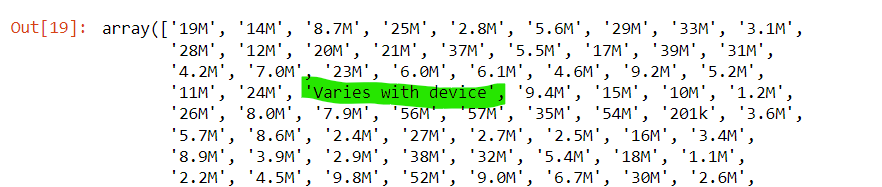

Şimdi "Size" column unda "Varies with device" olarak belirtilmiş değerlerin, bu column un medyanı (ortanca değeri) ile değişitirlmesini sağlayacağız. Bunun için öncelikle "Size" sütununun medyanını hesaplayalayacağız. Sonrada bu değer ile Varies with device değerlerini değiştireceğiz. Bu sayede "Size" sütununda "Varies with device" olarak belirtilmiş değerlerin ne olduğu belirsiz olduğu için, bu değerleri bu sütunun medyanı ile doldurarak aslında bir feature engineering yapıyoruz.

Medyan, genellikle aykırı değerlerin etkisinden daha az etkilenir, bu yüzden eksik veya belirsiz verileri doldurmak için iyi bir seçenek olarak düşünülebilir.

Bu işlemi yapmak için, öncelikle "Varies with device" olmayan satırların medyanını hesaplayabilir ve ardından bu medyan değeri ile "Varies with device" olan satırları değiştirebilirsiniz. 

**df[df["Size"]!="Varies with device"]:** DataFrame'den ("df"), "Size" sütunu "Varies with device" olmayan satırları seçer.

**["Size"].astype(float):** Seçilen satırların "Converted_Size" sütununu float türüne dönüştürür. Bu, medyanı hesaplamak için gereklidir çünkü medyan, sayısal bir ölçüdür.

**.median():** "Converted_Size" sütununun medyanını hesaplar.

Sonuç olarak, size_median değişkeni bu medyan değerini saklar. Bu değer, "Converted_Size" sütununda "Varies with device" olarak belirtilmiş veya eksik olan değerleri doldurmak için kullanılabilir. 

Medyan, veri setindeki aykırı değerlerden daha az etkilendiği için, genellikle eksik verileri doldurmak için iyi bir seçenektir.

In [80]:
size_median = df[df["Converted_Size"]!="Varies with device"]["Converted_Size"].astype(float).median()
size_median

13.0

**Kod Açıklaması**

Bu kod parçası, "Size" sütununda "Varies with device" olarak belirtilmiş değerleri, daha önce hesaplanmış olan size_median (medyan) değeri ile değiştirir.

**df["Size"].replace("Varies with device", size_median, inplace=True):** "Size" sütununda "Varies with device" olarak belirtilmiş tüm değerleri size_median ile değiştirir. inplace=True parametresi, değişikliklerin aynı DataFrame üzerinde yapılmasını sağlar.

Bu işlem, "Size" sütununda belirsiz olan değerleri bir sayısal değerle doldurur, böylece bu sütun daha sonra sayısal analizler veya makine öğrenimi modelleri için kullanılabilir hale gelir. Bu tür bir değişiklik, genellikle öznitelik mühendisliği olarak kabul edilir, çünkü modelin bu öznitelikten (sütundan) daha etkili bir şekilde yararlanabilmesi için veriyi dönüştürmeyi amaçlar.

In [82]:
df["Converted_Size"].replace("Varies with device", size_median, inplace=True)

**pd.to_numeric(df.Converted_Size):** Pandas'ın to_numeric fonksiyonu, "Converted_Size" sütunundaki değerleri sayısal bir formata dönüştürür. Eğer dönüşüm sırasında bir hata olursa (örneğin, sayısal olmayan bir değer varsa), bir hata mesajı döndürecektir.

Bu işlem, "Converted_Size" sütununun sayısal analizler veya makine öğrenimi modelleri için kullanılabilir hale gelmesini sağlar. 

In [84]:
df.Converted_Size = pd.to_numeric(df.Converted_Size)

In [85]:
df.Converted_Size.head()

0    19.0
1    14.0
2     8.7
3    25.0
4     2.8
Name: Converted_Size, dtype: float64

**df.Size.describe().round()** kodu, "Converted_Size" sütununun temel istatistiklerini hesaplar ve bu değerleri en yakın tam sayıya yuvarlar.

In [87]:
df.Converted_Size.describe().round(1)

count    8821.0
mean       21.3
std        22.5
min         0.0
25%         4.7
50%        13.0
75%        29.0
max       100.0
Name: Converted_Size, dtype: float64

In [88]:
df.drop("Size", axis=1, inplace=True)

In [89]:
df.columns

Index(['App', 'Category', 'Rating', 'Reviews', 'Installs', 'Type', 'Price',
       'Content_Rating', 'Genres', 'Last_Updated', 'Current_Ver',
       'Android_Ver', 'Converted_Size'],
      dtype='object')

## <font color='green'> <b>Installs</b> <font color='black'>   

In [91]:
df["Installs"].unique()

array(['10,000+', '500,000+', '5,000,000+', '50,000,000+', '100,000+',
       '50,000+', '1,000,000+', '10,000,000+', '5,000+', '100,000,000+',
       '1,000,000,000+', '1,000+', '500,000,000+', '50+', '100+', '500+',
       '10+', '1+', '5+', '0+'], dtype=object)

**df.Installs = df.Installs.apply(lambda x:x.replace("+","")):** Bu kod, "Installs" sütunundaki her bir değerde "+" karakterini kaldırır. Örneğin, "10,000+" değeri "10,000" olarak değiştirilir.

**df.Installs = df.Installs.apply(lambda x:x.replace(",","")):** Bu kod, "Installs" sütunundaki her bir değerde virgül (",") karakterini kaldırır. Örneğin, "10,000" değeri "10000" olarak değiştirilir.

**df.Installs = df.Installs.apply(lambda x:int(x)):** Bu kod, "Installs" sütunundaki her bir değeri bir tam sayıya (int) dönüştürür. Örneğin, "10000" değeri 10000 olarak değiştirilir (string değil, tam sayı).

Bu işlemler, "Installs" sütununu sayısal analizler veya makine öğrenimi modelleri için uygun bir forma getirir. Bu tür bir dönüşüm genellikle öznitelik mühendisliği olarak kabul edilir, çünkü modelin bu öznitelikten daha etkili bir şekilde yararlanabilmesi için veriyi dönüştürmeyi amaçlar.

In [93]:
df.Installs = df.Installs.apply(lambda x:x.replace("+",""))
df.Installs = df.Installs.apply(lambda x:x.replace(",",""))
df.Installs = df.Installs.apply(lambda x:int(x))

# df.Installs = df.Installs.apply(lambda x: int(x.replace("+", "").replace(",", "")

In [94]:
df["Installs"].unique()

array([     10000,     500000,    5000000,   50000000,     100000,
            50000,    1000000,   10000000,       5000,  100000000,
       1000000000,       1000,  500000000,         50,        100,
              500,         10,          1,          5,          0],
      dtype=int64)

Bu benzersiz değerler, uygulamaların ne kadar indirildiğini gösterir. Örneğin:

10,000: Uygulamanın 10,000 kez indirildiğini gösterir.

500,000: Uygulamanın 500,000 kez indirildiğini gösterir.

1,000,000: Uygulamanın 1,000,000 kez indirildiğini gösterir.

... ve benzeri.

Bu değerlerin tam sayı olarak saklanması, sayısal analizler ve makine öğrenimi modelleri için bu sütunu daha kullanışlı hale getirir.

Örneğin, bu sayısal değerleri bir regresyon modelinde bağımlı veya bağımsız değişken olarak kullanabilirsiniz.

## <font color='green'><b>Price</b> <font color='black'>   

Bu bilgi, "Price" sütununu nasıl önişleyeceğinizi (preprocess) veya dönüştüreceğinizi (transform) belirlemeniz için önemli olabilir. Örneğin, eğer bu sütun sayısal değerler içeriyorsa fakat bu değerler bir string formatında saklanıyorsa (örneğin, "$1.99" gibi), bu değerleri sayısal bir formata dönüştürmek gerekebilir.

Bu tür bir analiz, veri setinin genel bir anlayışını kazanmak ve özellikle bu sütunun modelleme aşamasına geçmeden önce nasıl bir dağılım gösterdiğini anlamak için yararlıdır.

In [98]:
df["Price"].unique()

array(['0', '$4.99', '$3.99', '$6.99', '$1.49', '$2.99', '$7.99', '$5.99',
       '$3.49', '$1.99', '$9.99', '$7.49', '$0.99', '$9.00', '$5.49',
       '$10.00', '$24.99', '$11.99', '$79.99', '$16.99', '$14.99',
       '$1.00', '$29.99', '$12.99', '$2.49', '$10.99', '$1.50', '$19.99',
       '$15.99', '$33.99', '$74.99', '$39.99', '$3.95', '$4.49', '$1.70',
       '$8.99', '$2.00', '$3.88', '$25.99', '$399.99', '$17.99',
       '$400.00', '$3.02', '$1.76', '$4.84', '$4.77', '$1.61', '$2.50',
       '$1.59', '$6.49', '$1.29', '$5.00', '$13.99', '$299.99', '$379.99',
       '$37.99', '$18.99', '$389.99', '$19.90', '$8.49', '$1.75',
       '$14.00', '$4.85', '$46.99', '$109.99', '$154.99', '$3.08',
       '$2.59', '$4.80', '$1.96', '$19.40', '$3.90', '$4.59', '$15.46',
       '$3.04', '$4.29', '$2.60', '$3.28', '$4.60', '$28.99', '$2.95',
       '$2.90', '$1.97', '$200.00', '$89.99', '$2.56', '$30.99', '$3.61',
       '$394.99', '$1.26', '$1.20', '$1.04'], dtype=object)

**df.Price = df.Price.apply(lambda x:x.replace("$","")):** Bu satır, "Price" sütunundaki değerlerin başındaki `\$` işaretini kaldırır. apply yöntemi, her bir sütun değerine belirli bir işlem uygulamanıza olanak tanır. Bu durumda, lambda fonksiyonu kullanılarak her bir değerdeki `\$` işareti boş bir dizeyle değiştirilir.

**df.Price = df.Price.apply(lambda x:float(x)):** Bu satır, "Price" sütunundaki değerleri ondalık (float) bir sayıya dönüştürür. apply yöntemi, her bir sütun değerine dönüşüm işlemi uygulamak için kullanılır. Bu durumda, float() fonksiyonu ile her bir değer ondalık bir sayıya dönüştürülür.

Sonuç olarak, bu kod parçacığı "Price" sütunundaki değerleri temizler ve ondalık sayı veri türüne dönüştürür. Bu işlem, sütundaki fiyatları sayısal veriler olarak kullanmanız gerektiğinde oldukça yararlıdır.

In [100]:
df.Price = df.Price.apply(lambda x:x.replace("$",""))
df.Price = df.Price.apply(lambda x:float(x))

# df.Price = df.Price.apply(lambda x: float(x.replace("$", "")))

In [101]:
df["Price"].unique()

array([  0.  ,   4.99,   3.99,   6.99,   1.49,   2.99,   7.99,   5.99,
         3.49,   1.99,   9.99,   7.49,   0.99,   9.  ,   5.49,  10.  ,
        24.99,  11.99,  79.99,  16.99,  14.99,   1.  ,  29.99,  12.99,
         2.49,  10.99,   1.5 ,  19.99,  15.99,  33.99,  74.99,  39.99,
         3.95,   4.49,   1.7 ,   8.99,   2.  ,   3.88,  25.99, 399.99,
        17.99, 400.  ,   3.02,   1.76,   4.84,   4.77,   1.61,   2.5 ,
         1.59,   6.49,   1.29,   5.  ,  13.99, 299.99, 379.99,  37.99,
        18.99, 389.99,  19.9 ,   8.49,   1.75,  14.  ,   4.85,  46.99,
       109.99, 154.99,   3.08,   2.59,   4.8 ,   1.96,  19.4 ,   3.9 ,
         4.59,  15.46,   3.04,   4.29,   2.6 ,   3.28,   4.6 ,  28.99,
         2.95,   2.9 ,   1.97, 200.  ,  89.99,   2.56,  30.99,   3.61,
       394.99,   1.26,   1.2 ,   1.04])

## <font color='green'> <b>Genres</b><font color='black'>  

In [103]:
df["Genres"].nunique()

119

In [104]:
df["Genres"].head(10)

0                 Art & Design
1    Art & Design;Pretend Play
2                 Art & Design
3                 Art & Design
4      Art & Design;Creativity
5                 Art & Design
6                 Art & Design
7                 Art & Design
8                 Art & Design
9      Art & Design;Creativity
Name: Genres, dtype: object

Bu çıktı, "Genres" sütununun ilk 10 satırını göstermektedir. Gördüğümüz gibi, bu sütun genellikle bir veya birden fazla tür veya kategori içermektedir. Türler ve kategoriler arasında bir noktalı virgül **(";")** ile ayrım yapılmış.

**Örneğin:**

"Art & Design": Bu, uygulamanın "Art & Design" kategorisine ait olduğunu gösterir.
"Art & Design;Pretend Play": Bu, uygulamanın hem "Art & Design" hem de "Pretend Play" kategorilerine ait olduğunu gösterir.
"Art & Design;Creativity": Bu, uygulamanın hem "Art & Design" hem de "Creativity" kategorilerine ait olduğunu gösterir.
Bu tür bir sütun, genellikle kategorik bir öznitelik olarak kabul edilir ve bu tür öznitelikler genellikle makine öğrenimi modelleri için önişleme gerektirir. Örneğin, bu tür bir sütunu modelinize dahil etmek istiyorsanız, "One-Hot Encoding" gibi bir yöntem kullanarak bu kategorik değişkeni sayısal bir forma dönüştürebilirsiniz.

Bu çıktı ayrıca, veri setinin ne tür uygulamaları kapsadığı hakkında da fikir verir. Örneğin, bu örnek veri seti, ilk 10 satırda yalnızca "Art & Design" kategorisine ait uygulamaları içermektedir. Ancak bu, tüm veri setinin de bu şekilde olduğu anlamına gelmez; bu yalnızca ilk 10 satır için geçerlidir.

119 unique olan column u ben burada biraz azaltacağım bu sebeple özellikle noktalı virgülle ayrılan türlerin olduğu satıra bakalım burada alt türleri almak istemiyorum. Ana tür ile yürümek istiyorum. Bu kapsamda buna yönelik bir kod yazacağım.

**Kod Açıklaması**

Bu kod parçası, "Genres" sütunundaki değerleri noktalı virgül (";") ile ayırır ve ardından ilk öğeyi (index 0) alır. Yani eğer bir satırda birden fazla tür veya kategori varsa (örneğin, "Art & Design;Pretend Play"), bu kod sadece ilk türü veya kategoriyi alır ("Art & Design").


**df["Genres"].str.split(";"):** Bu kısım, "Genres" sütunundaki her bir değeri noktalı virgül (";") ile ayırır. Sonuç olarak her bir satır için bir liste döner.

**.str[0]:** Bu kısım, oluşturulan listenin ilk öğesini alır (Python'da indexler 0'dan başlar).

Bu işlem, "Genres" sütununu daha basit bir forma dönüştürmeyi amaçlar. Örneğin, eğer bir uygulama birden fazla türe sahipse, bu kod sadece ilk türü alır. Bu, özellikle makine öğrenimi modelleri için veri setini daha yönetilebilir hale getirebilir, ancak bu yaklaşımın bir uygulamanın birden fazla türü veya kategorisi olduğu durumda bazı bilgileri kaybedebileceğini unutmamak önemlidir.

In [107]:
df["Genres"] = df["Genres"].str.split(";").str[0]

**Kod açıklaması**

**len(df["Genres"].unique())** kodu, "Genres" sütununda kaç farklı benzersiz değer olduğunu sayar.

Bu kod, "Genres" sütununun ne kadar çeşitli olduğu hakkında bir fikir verir. Örneğin, eğer bu sayı çok yüksekse, bu sütunun çok fazla farklı kategori veya tür içerdiğini gösterir. Eğer sayı düşükse, bu genellikle sütunun daha az çeşitlilik gösterdiği anlamına gelir.

Bu tür bir analiz, veri setinin genel bir anlayışını kazanmak ve özellikle bu sütunun modelleme aşamasına geçmeden önce nasıl bir dağılım gösterdiğini anlamak için yararlıdır.

In [109]:
df["Genres"].nunique()

48

In [110]:
df["Genres"].unique()

array(['Art & Design', 'Auto & Vehicles', 'Beauty', 'Books & Reference',
       'Business', 'Comics', 'Communication', 'Dating', 'Education',
       'Entertainment', 'Events', 'Finance', 'Food & Drink',
       'Health & Fitness', 'House & Home', 'Libraries & Demo',
       'Lifestyle', 'Adventure', 'Arcade', 'Casual', 'Card', 'Action',
       'Strategy', 'Puzzle', 'Sports', 'Music', 'Word', 'Racing',
       'Simulation', 'Board', 'Trivia', 'Role Playing', 'Educational',
       'Music & Audio', 'Video Players & Editors', 'Medical', 'Social',
       'Shopping', 'Photography', 'Travel & Local', 'Tools',
       'Personalization', 'Productivity', 'Parenting', 'Weather',
       'News & Magazines', 'Maps & Navigation', 'Casino'], dtype=object)

In [111]:
df["Genres"].value_counts()

Genres
Tools                      841
Entertainment              627
Education                  609
Business                   427
Medical                    408
Productivity               407
Personalization            386
Lifestyle                  374
Action                     371
Sports                     368
Communication              367
Finance                    360
Photography                322
Health & Fitness           308
Social                     280
News & Magazines           264
Casual                     263
Travel & Local             237
Arcade                     234
Books & Reference          232
Shopping                   224
Simulation                 216
Dating                     196
Video Players & Editors    178
Puzzle                     161
Maps & Navigation          137
Food & Drink               124
Role Playing               120
Racing                     119
Strategy                   108
Educational                106
Adventure                   91
A

Bu output ile Music ve Music & Audio nun aynı anlamda kullanıldığı izlenimini veriyor bu sebeple hepsini Music olarak düzeltmem doğru olacaktır.

In [113]:
df["Genres"].replace("Music & Audio", "Music", inplace =True)

## <font color='Green'> <b>Last_Updated</b><font color='black'> 

"Last_Updated" sütunu, uygulamanın en son ne zaman güncellendiğini gösteren tarihleri içerir. Bu sütun genellikle tarih formatında olur (örneğin, "January 7, 2018").

Bu kodun çıktısı, bu sütunun genel yapısını ve tarihlerin nasıl saklandığını gösterir. Eğer bu sütunu modelinizde kullanmayı planlıyorsanız, tarihleri sayısal bir forma dönüştürmek veya tarihler arasında geçen gün sayısını hesaplamak gibi önişleme adımları gerekebilir.

Bu tür bir analiz, veri setinin genel bir anlayışını kazanmak ve özellikle bu sütunun modelleme aşamasına geçmeden önce nasıl bir dağılım gösterdiğini anlamak için yararlıdır.

In [116]:
df["Last_Updated"].head()

0     January 7, 2018
1    January 15, 2018
2      August 1, 2018
3        June 8, 2018
4       June 20, 2018
Name: Last_Updated, dtype: object

**pd.to_datetime(df["Last_Updated"]):** Pandas kütüphanesinin to_datetime fonksiyonu, bir dizi, serisi veya tek bir tarih değerini datetime nesnesine dönüştürebilir. Bu kod parçası, "Last_Updated" sütunundaki tüm değerleri datetime nesnesine dönüştürür.

Bu dönüştürme işlemi, tarihlerle daha kolay çalışabilmek için yararlıdır. Örneğin, şimdi bu sütunu kullanarak uygulamanın en son ne zaman güncellendiğinden bu yana geçen gün sayısını hesaplayabilir, veya yıllara, aylara veya günler gibi belirli bir zaman dilimine göre gruplayabilirsiniz. 

In [118]:
# Tarih-saat dizisini oluştur

df["Last_Updated"] = pd.to_datetime(df["Last_Updated"])

In [119]:
# Yıl, Ay ve Gün'ü ayrı sütunlara ayır

df['Year'] = df['Last_Updated'].dt.year
df['Month'] = df['Last_Updated'].dt.month
df['Day'] = df['Last_Updated'].dt.day

In [120]:
df.head()

,App,Category,Rating,Reviews,Installs,Type,Price,Content_Rating,Genres,Last_Updated,Current_Ver,Android_Ver,Converted_Size,Year,Month,Day
0,Photo Editor & Candy Camera & Grid & ScrapBook,Art and design,4.1,159,10000,Free,0.0,Everyone,Art & Design,2018-01-07,1.0.0,4.0.3 and up,19.0,2018,1,7
1,Coloring book moana,Art and design,3.9,967,500000,Free,0.0,Everyone,Art & Design,2018-01-15,2.0.0,4.0.3 and up,14.0,2018,1,15
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",Art and design,4.7,87510,5000000,Free,0.0,Everyone,Art & Design,2018-08-01,1.2.4,4.0.3 and up,8.7,2018,8,1
3,Sketch - Draw & Paint,Art and design,4.5,215644,50000000,Free,0.0,Teen,Art & Design,2018-06-08,Varies with device,4.2 and up,25.0,2018,6,8
4,Pixel Draw - Number Art Coloring Book,Art and design,4.3,967,100000,Free,0.0,Everyone,Art & Design,2018-06-20,1.1,4.4 and up,2.8,2018,6,20


In [121]:
df.dtypes

App                       object
Category                  object
Rating                   float64
Reviews                    int64
Installs                   int64
Type                      object
Price                    float64
Content_Rating            object
Genres                    object
Last_Updated      datetime64[ns]
Current_Ver               object
Android_Ver               object
Converted_Size           float64
Year                       int32
Month                      int32
Day                        int32
dtype: object

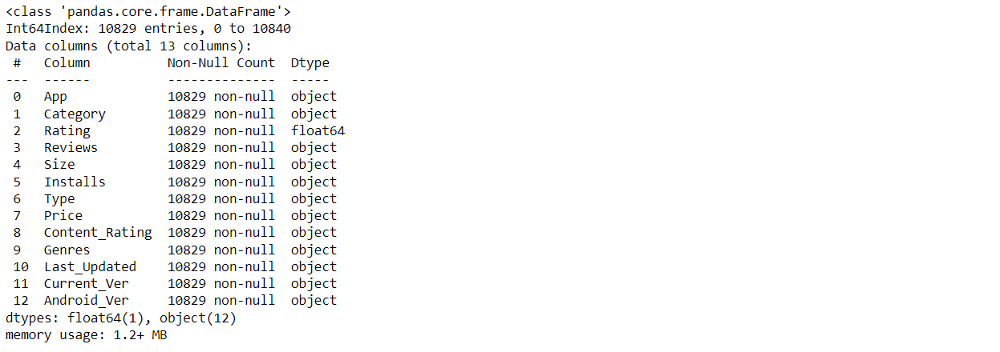

<a id='research-queries'></a>
# **Araştırma Sorguları ve Analitik Bilgiler**

## <font color='orange'><b> Uygulama sayısına göre en iyi kategoriler hangileri?</b><font color='black'> 

Type sütunundaki değerlerin frekansını gösteren bir bar grafiği oluşturuyoruz.

**type_counts = df['Type'].value_counts():** Bu satır, Type sütunundaki her bir benzersiz değerin kaç kez tekrar ettiğini hesaplar ve bu bilgiyi type_counts değişkenine kaydeder.

**plt.figure(figsize=(15, 10)):** Bu satır, oluşturulacak grafik için boyutu 15x10 olarak ayarlar.

**plt.bar(type_counts.index, type_counts.values, color=['blue', 'orange']):** Bu satır, bar grafiğini çizer. type_counts.index x ekseninde gösterilecek değerlerdir ("Free" ve "Paid"), type_counts.values ise y ekseninde gösterilecek değerlerdir (her bir tür için uygulama sayısı).

**plt.xlabel('Uygulama Türü'), plt.ylabel('Uygulama Sayısı'), plt.title('Uygulama Türüne Göre Uygulama Sayısı'):** Bu satırlar, x ve y eksenlerine etiket ekler ve grafiğe bir başlık verir.

**plt.show():** Bu satır, grafiği gösterir.

In [126]:
# 'Type' sütunundaki değerlerin sayısını al

type_counts = df['Type'].value_counts()
type_counts

Type
Free    9584
Paid     762
Name: count, dtype: int64

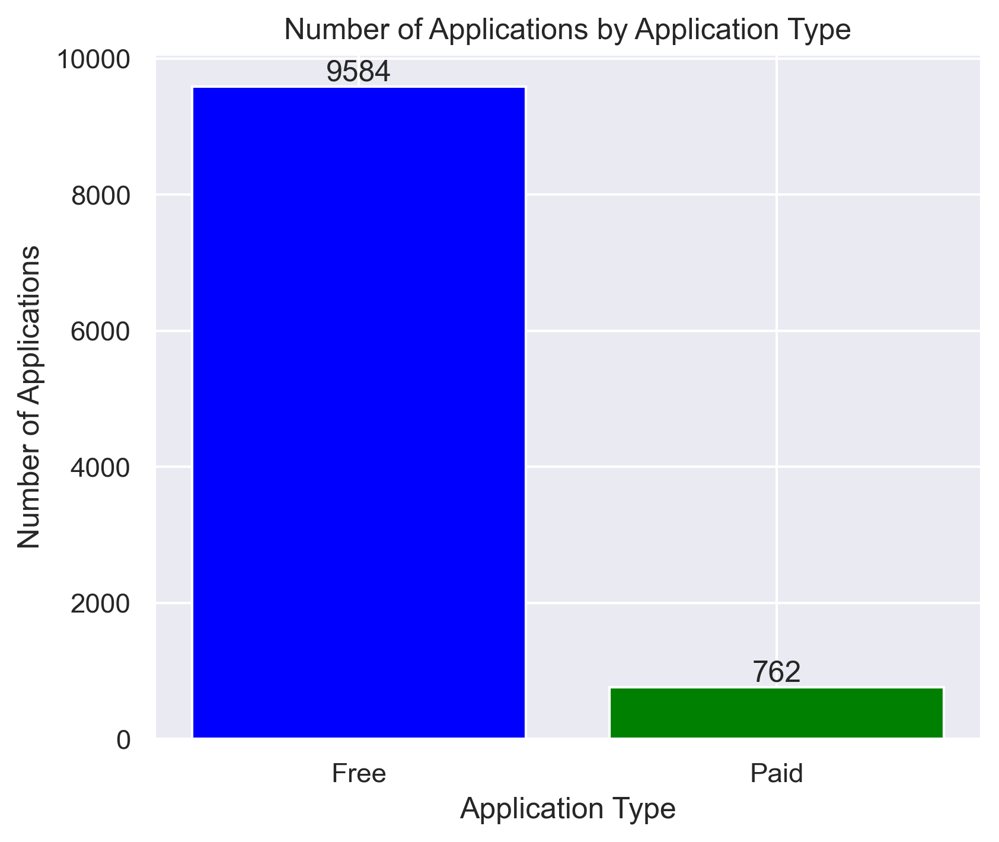

In [127]:
plt.figure(figsize=(6, 5))  # Grafik boyutunu ayarla
bars = plt.bar(type_counts.index, type_counts.values, color=['blue', 'green'])  # "bars" değişkenine atama yap

# Eksen etiketleri ve başlık
plt.xlabel('Application Type')
plt.ylabel('Number of Applications')
plt.title('Number of Applications by Application Type')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), va='bottom', ha='center')
    
plt.show()

## <font color='orange'> <b>Derecelendirmelerin uygulama türüne göre dağılımı nedir?</b><font color='black'> 

Type sütunundaki her bir benzersiz değer ("Free" ve "Paid") için Rating değerlerinin bir box plot'ını çiziyoruz.

**plt.figure(figsize=(15, 10)):** Bu satır, oluşturulacak grafik için boyutu 15x10 olarak ayarlar.

**sns.boxplot(...):** Bu satır, seaborn kütüphanesini kullanarak box plot'u çizer. palette parametresi ile "Free" için mavi ("blue") ve "Paid" için yeşil ("green") renkler ayarlanmıştır.

**plt.xlabel('Uygulama Türü'), plt.ylabel('Rating'), plt.title('Uygulama Türüne Göre Rating Dağılımı'):** Bu satırlar, x ve y eksenlerine etiket ekler ve grafiğe bir başlık verir.

**plt.show():** Bu satır, grafiği gösterir.

In [165]:
average_ratings = df.groupby('Type')['Rating'].mean()
average_ratings

Type
Free    4.198560
Paid    4.269291
Name: Rating, dtype: float64

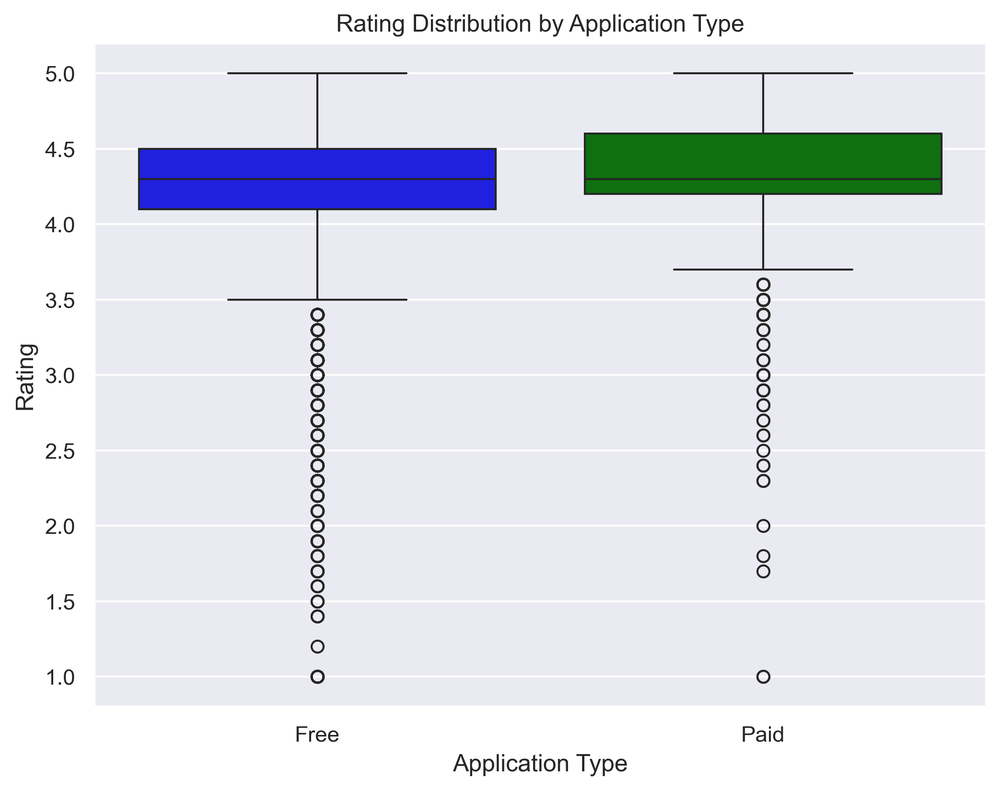

In [166]:
# Grafik boyutunu ayarla
plt.figure(figsize=(8, 6))

# Seaborn kütüphanesi ile box plot çiz ve renkleri ayarla
sns.boxplot(x='Type', y='Rating', data=df, palette={"Free": "blue", "Paid": "green"}) # whis=3 yapabiliriz

# Eksen etiketleri ve başlık
plt.xlabel('Application Type')
plt.ylabel('Rating')
plt.title('Rating Distribution by Application Type')

# Göster
plt.show()

**Alt yatay çizgi (whisker) = Minimum (En Düşük Değer):** Veri setindeki en düşük değeri temsil eder. Ancak, bu çizgi aykırı değerleri (outliers) göz ardı eder.

**Üst yatay çizgi (whisker) = Maksimum (En Yüksek Değer):** Veri setindeki en yüksek değeri temsil eder. Ancak, bu çizgi de aykırı değerleri göz ardı eder.

**Kutunun alt kenarı = İlk Çeyrek (Q1):** Veri setinin ilk çeyreğini (ilk 25%) temsil eder.

**Kutunun üst kenarı = Üçüncü Çeyrek (Q3):** Veri setinin üçüncü çeyreğini (ilk 75%) temsil eder.

**Kutu içindeki yatay çizgi = Median (Q2):** Veri setinin medyanını (ortanca değerini) temsil eder.

- **IQR (Interquartile Range):** İlk ve üçüncü çeyrekler arasındaki fark, yani kutunun yüksekliği. IQR, veri dağılımının ne kadar yaygın olduğunu gösterir.

- **Aykırı Değerler (Outliers):** Üst ve alt yatay çizgilerin dışında kalan noktalar, aykırı değerleri temsil eder.

- **Kutu (Box):** İlk çeyrek (Q1) ve üçüncü çeyrek (Q3) arasındaki alanı temsil eder ve veri setinin merkezi dağılımını gösterir.

Bu grafik, ücretsiz ve ücretli uygulamaların rating dağılımlarını karşılaştırmanıza olanak tanır. Örneğin, ücretsiz uygulamaların rating'leri genellikle daha mı yüksek, yoksa ücretli uygulamalar mı daha yüksek puan alıyor, gibi sorulara cevap arayabilirsiniz. Ayrıca, aykırı değerlerin varlığı da gözlemlenebilir.

## <font color='orange'><b> Derecelendirme kategorileri ve sayıları nelerdir?</b><font color='black'> 

Veri kümesinde bulunan farklı "Rating" (Puan) kategorilerinin ne kadar sık olduğunu gösteriyoruz. 

**plt.figure(figsize=(15, 10)):** Matplotlib kütüphanesini kullanarak oluşturulacak grafik için boyutu ayarlar. Genişlik 15 birim, yükseklik 10 birim olarak belirlenmiştir.

**sns.countplot(x="Rating", data=df):** Seaborn kütüphanesinin countplot fonksiyonu ile "Rating" sütunundaki değerlerin sayısını gösteren bir dikey bar plot çizer. x parametresi ile hangi sütunun kullanılacağı belirlenir, data parametresi ile de veri çerçevesi belirlenir.

**plt.title("Puan Kategorileri ve Sayıları"):** Grafik başlığını ayarlar.

**plt.xlabel("Rating Kategorileri") ve plt.ylabel("Uygulama Sayısı"):** X ve Y eksenlerinin etiketlerini ayarlar.

**plt.show():** Grafiği ekrana çizer.

- Hangi puan kategorisi en çok veya en az gözleme sahiptir?

- Puan dağılımı nasıldır? (örneğin, çoğu uygulama yüksek puanlı mı, düşük puanlı mı?)

- Puan kategorileri arasında belirgin bir dengesizlik var mı?

In [170]:
rating_counts = df['Rating'].value_counts().sort_index()
rating_counts

Rating
1.0      16
1.2       1
1.4       3
1.5       3
1.6       4
1.7       8
1.8       8
1.9      12
2.0      12
2.1       8
2.2      14
2.3      20
2.4      19
2.5      20
2.6      24
2.7      23
2.8      40
2.9      45
3.0      82
3.1      69
3.2      63
3.3     101
3.4     127
3.5     157
3.6     169
3.7     231
3.8     293
3.9     372
4.0     538
4.1     656
4.2     887
4.3    2476
4.4    1031
4.5     976
4.6     768
4.7     484
4.8     228
4.9      87
5.0     271
Name: count, dtype: int64

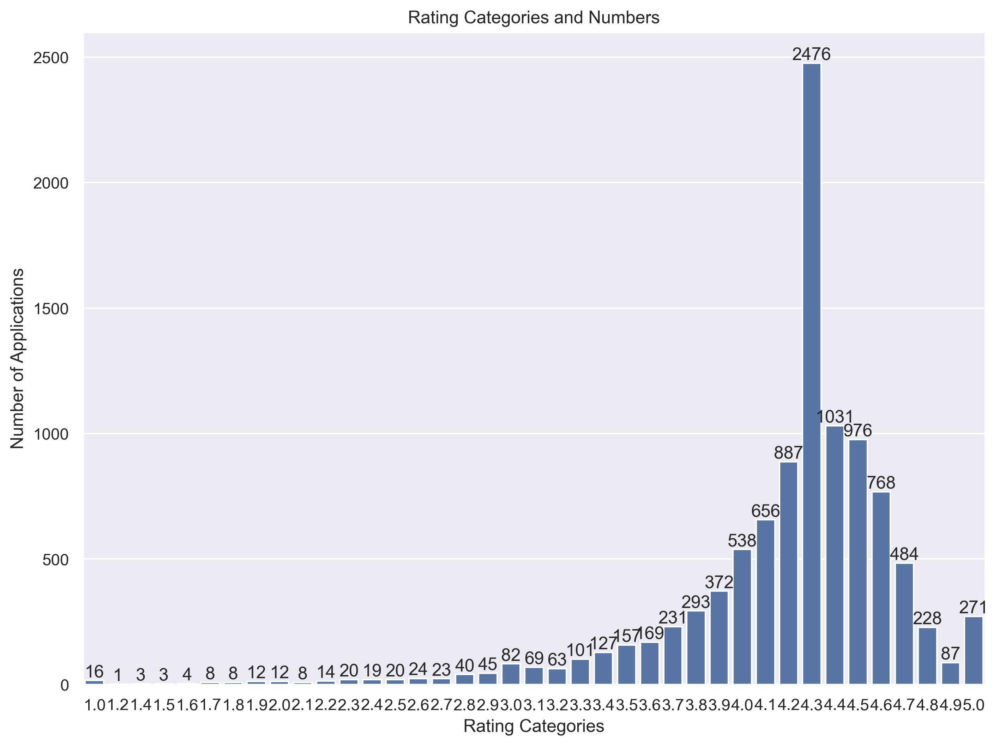

In [171]:
# Grafik boyutunu ayarla
plt.figure(figsize=(11,8))

# Seaborn ile dikey bar plot çiz
ax = sns.countplot(x="Rating", data=df) #Sıralamak için , order=df['Rating'].value_counts().sort_index().index

for container in ax.containers:
    ax.bar_label(container)

# Grafik başlığı
plt.title("Rating Categories and Numbers")

# Eksen etiketleri
plt.xlabel("Rating Categories")
plt.ylabel("Number of Applications")

# Grafik gösterimi
plt.show()

Veri kümesindeki uygulamaların "Content Rating" (İçerik Derecelendirmesi) kategorilerine göre dağılımını gösteriyoruz. 

**plt.figure(figsize=(15, 10)):** Grafik boyutunu ayarlar.

**sns.countplot(y="Content_Rating", data=df, order = df['Content_Rating'].value_counts().index):** "Content_Rating" sütunundaki değerlerin sayısını gösteren bir yatay bar plot çizer. y parametresi ile hangi sütunun kullanılacağı belirlenir. order parametresi ile bar'lar en yüksek sayıdan en düşüğe doğru sıralanır.

**plt.title("İçerik Derecelendirmeleri ve Sayıları"):** Grafik başlığını ayarlar.

**plt.xlabel("Uygulama Sayısı") ve plt.ylabel("Content Rating"):** X ve Y eksenlerinin etiketlerini ayarlar.

**plt.show():** Grafiki ekrana çizer.

- Hangi içerik derecelendirmesi en yaygın veya en nadir?

- İçerik derecelendirmeleri arasında nasıl bir dağılım var?

- Belirli bir yaş grubu veya hedef kitle için ne kadar uygulama mevcut?

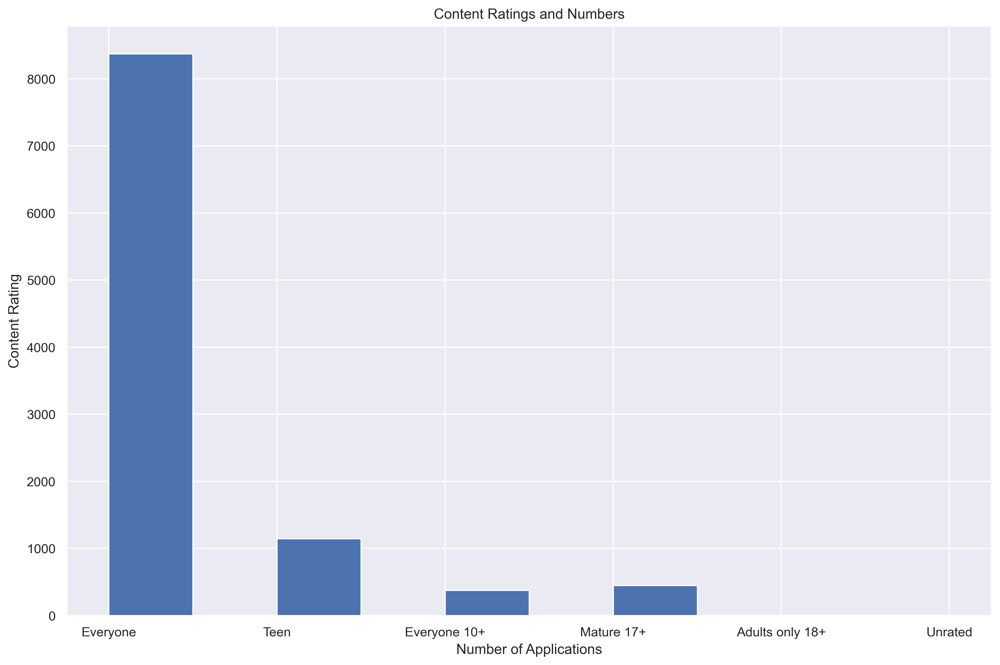

In [173]:
# Grafik boyutunu ayarla
plt.figure(figsize=(14, 9))
# Seaborn ile yatay bar plot çiz
plt.hist(x="Content_Rating", data=df)
# Grafik başlığı
plt.title("Content Ratings and Numbers")
# Eksen etiketleri
plt.xlabel("Number of Applications")
plt.ylabel("Content Rating")
# Grafik gösterimi
plt.show()

In [174]:
content_rating_counts = df['Content_Rating'].value_counts()
content_rating_counts

Content_Rating
Everyone           8372
Teen               1146
Mature 17+          447
Everyone 10+        376
Adults only 18+       3
Unrated               2
Name: count, dtype: int64

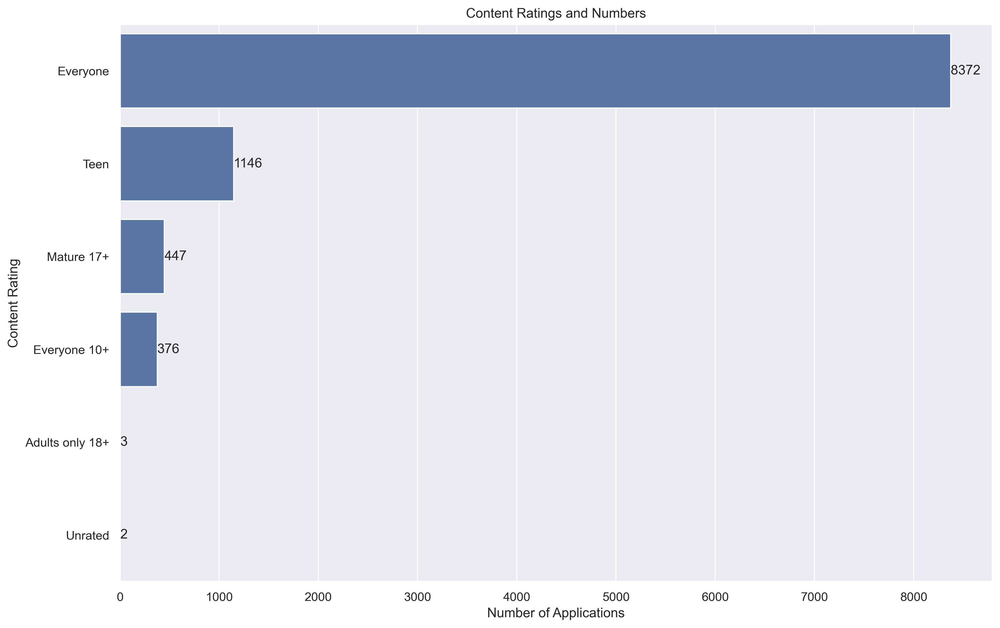

In [175]:
# Grafik boyutunu ayarla
plt.figure(figsize=(14, 9))

# Seaborn ile yatay bar plot çiz
ax = sns.countplot(y="Content_Rating", data=df, order = df['Content_Rating'].value_counts().index)

for container in ax.containers:
    ax.bar_label(container)

# Grafik başlığı
plt.title("Content Ratings and Numbers")

# Eksen etiketleri
plt.xlabel("Number of Applications")
plt.ylabel("Content Rating")

# Grafik gösterimi
plt.show()

## <font color='orange'> <b>İçerik Derecelendirmesi Uygulamalardaki Kullanıcı Derecelendirmelerini Nasıl Etkiler?</b><font color='black'>

Farklı "Content Rating" (İçerik Derecelendirmesi) kategorilerine sahip Android uygulamalarının kullanıcı puanları ("Rating") dağılımını gösteriyoruz.

**plt.figure(figsize=(15, 10)):** Grafik boyutunu ayarlar. Genişlik 15 birim, yükseklik 10 birim olarak belirlenmiştir. (Bu satır kodda eksik, eğer eklemek isterseniz.)

**sns.boxplot(x = "Content_Rating", y = "Rating", data = df):** Seaborn kütüphanesinin boxplot fonksiyonu ile "Content_Rating" sütunundaki kategorilere göre "Rating" sütununun dağılımını gösteren bir box plot çizer. x ve y parametreleri ile hangi sütunların kullanılacağı belirlenir, data parametresi ile de veri çerçevesi belirlenir.

**plt.title("The content rating & rating", size=20):** Grafik başlığını ve başlık boyutunu ayarlar.

- Her bir içerik derecelendirmesi kategorisinin puan dağılımı nasıldır?

- Hangi içerik derecelendirmesi kategorisinin ortalama puanı en yüksek veya en düşüktür?

- İçerik derecelendirmesi kategorileri arasında puan dağılımı açısından belirgin farklar var mı?

In [178]:
average_ratings_by_content = df.groupby('Content_Rating')['Rating'].mean()
average_ratings_by_content

Content_Rating
Adults only 18+    4.300000
Everyone           4.199164
Everyone 10+       4.256117
Mature 17+         4.138479
Teen               4.245462
Unrated            4.200000
Name: Rating, dtype: float64

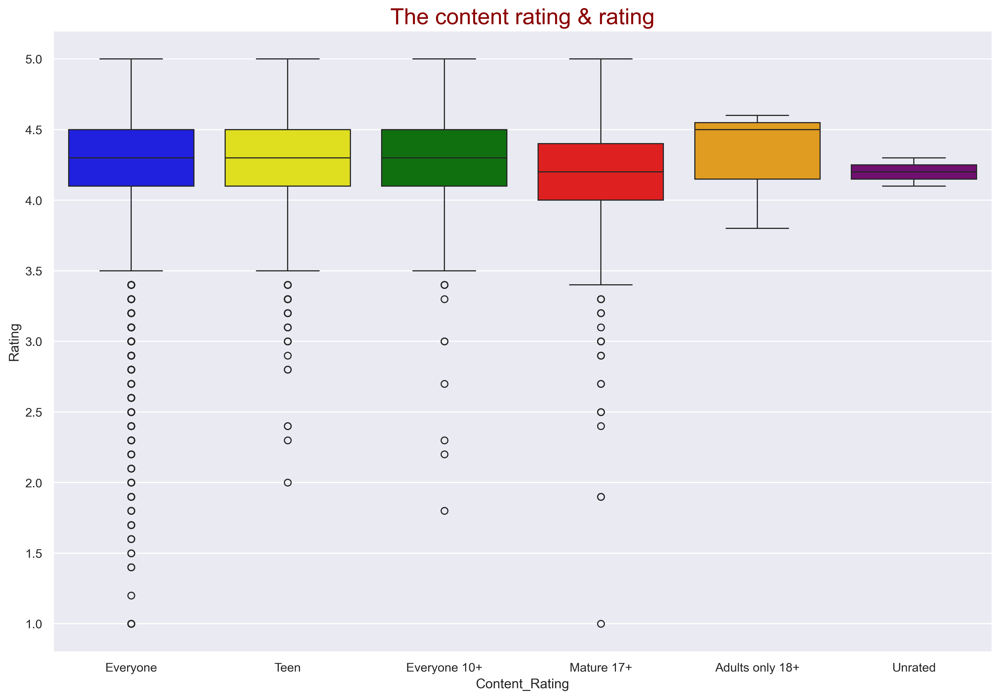

In [179]:
# Grafik boyutunu ayarla
plt.figure(figsize=(15, 10))

# Seaborn ile box plot çiz
# 'x' ve 'y' parametreleri ile hangi sütunların kullanılacağı belirlenir
# 'data' parametresi ile de veri çerçevesi belirlenir
# 'palette' parametresi ile her bir "Content_Rating" kategorisi için renkler belirlenir
sns.boxplot(x="Content_Rating", y="Rating", data=df, palette={"Everyone": "blue", 
                                                              "Teen": "yellow", 
                                                              "Everyone 10+": "green",
                                                              "Mature 17+": "red",
                                                              "Adults only 18+": "orange",
                                                              "Unrated": "purple"})

# Grafik başlığı ve başlık özellikleri
# 'fontdict' parametresi ile başlık için bir sözlük belirlenir
# 'fontsize' anahtarı ile başlık boyutunu 20 olarak, 'color' anahtarı ile de başlık rengini 'darkred' olarak ayarlar
plt.title("The content rating & rating", fontdict={'fontsize': 20, 'color': 'darkred'})

# Grafik gösterimi
plt.show()

Gördüğünüz gibi, Rating Everyone, Teen ve Everyone 10+ için neredeyse aynı. 

Everyone'ın diğer kategorilere göre daha fazla aykırı (outlier) değeri var.

Mature 17+ en düşük ortalamaya sahipken Adults only 18+ kategorisinin reyting ortalaması diğerlerinden daha yüksektir.

## <font color='orange'> <b>Her Kategorideki Yüklenme Sayısı Ne Kadardır?</b><font color='black'>

**Kod Açıklaması**

**plt.figure(figsize=(15, 10)):** Matplotlib kütüphanesini kullanarak oluşturulacak grafik için boyutu ayarlar. Genişlik 15 birim, yükseklik 10 birim olarak belirlenmiştir.

**sns.countplot(y="Category", data=df, order=df['Category'].value_counts().index):** Seaborn kütüphanesinin countplot fonksiyonu ile "Category" sütunundaki değerlerin sayısını gösteren bir yatay bar plot çizer. y parametresi ile hangi sütunun kullanılacağı belirlenir, data parametresi ile de veri çerçevesi belirlenir. order parametresi ile bar'lar en yüksek sayıdan en düşüğe doğru sıralanır.

**plt.title("Kategoriye Göre Uygulama Sayıları", fontdict={'fontsize': 20, 'color': 'darkred'}):** Grafik başlığını ve başlık boyutunu ayarlar. fontdict parametresi ile başlık için bir sözlük belirlenir. fontsize anahtarı ile başlık boyutunu 20 olarak, color anahtarı ile de başlık rengini 'darkred' olarak ayarlar.

**plt.xlabel("Uygulama Sayısı") ve plt.ylabel("Kategoriler"):** X ve Y eksenlerinin etiketlerini ayarlar.

**plt.show():** Grafiki ekrana çizer.

In [183]:
category_counts = df['Category'].value_counts()
category_counts

Category
Family                 1939
Game                   1121
Tools                   841
Business                427
Medical                 408
Productivity            407
Personalization         386
Lifestyle               373
Communication           366
Finance                 360
Sports                  351
Photography             322
Health and fitness      306
Social                  280
News and magazines      264
Travel and local        237
Books and reference     229
Shopping                224
Dating                  196
Video players           175
Maps and navigation     137
Education               130
Food and drink          124
Entertainment           111
Auto and vehicles        85
Libraries and demo       84
Weather                  82
House and home           80
Events                   64
Art and design           64
Parenting                60
Comics                   60
Beauty                   53
Name: count, dtype: int64

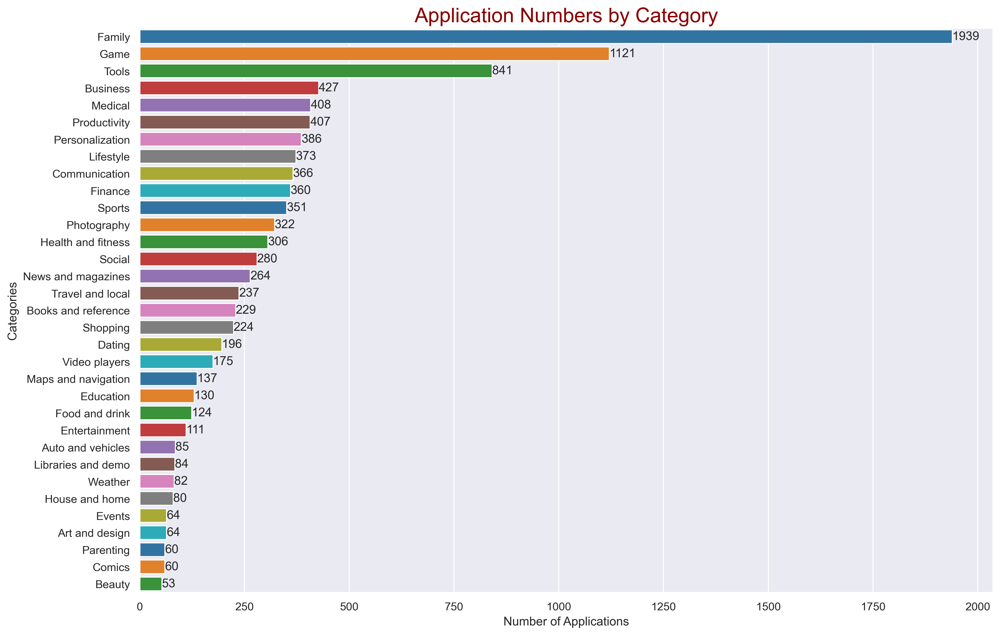

In [184]:
# Grafik boyutunu ayarla
plt.figure(figsize=(15, 10))

# Seaborn ile yatay bar plot çiz. y dersem y eksenini kullanacağından yatay bir bar plot çizecektir.
# 'y' parametresi ile hangi sütunun kullanılacağı belirlenir, 'data' parametresi ile de veri çerçevesi belirlenir
ax = sns.countplot(y="Category", data=df, order=df['Category'].value_counts().index, palette='tab10')

for container in ax.containers:
    ax.bar_label(container)
    
# Grafik başlığı ve başlık özellikleri
plt.title("Application Numbers by Category", fontdict={'fontsize': 20, 'color': 'darkred'})

# Eksen etiketleri
plt.xlabel("Number of Applications")
plt.ylabel("Categories")

# Grafik gösterimi
plt.show()

En çok uygulama Family (aile), sonra Game (oyun), sonra da Tools (araçlar) kategorisindedir.

## <font color='orange'> <b>Uygulamalarda En Yüksek Toplam Harcamayı Hangi Kategoriler Yapıyor?</b><font color='black'>

Google Play Store'da en çok harcama yapılan 5 kategoriyi ve bu kategorilere ne kadar toplam harcama yapıldığını gösteren bir bar grafiği çizdiriyoruz.

**total_spending_by_category = df.groupby('Category')['Price'].sum().sort_values(ascending=False): Kategorilere göre toplam harcamayı hesapla:** 'Category' sütununa göre gruplayarak, her kategoride ne kadar toplam harcama yapıldığını hesaplıyoruz.

**top5_categories = total_spending_by_category.nlargest(5): En çok harcama yapılan 5 kategoriyi seç:** Toplam harcamaları büyükten küçüğe sıralayarak en çok harcama yapılan 5 kategoriyi seçiyoruz.

**plt.figure(figsize=(15, 10)): Bar grafiği çiz:** Seçilen 5 kategoriyi ve bu kategorilere yapılan toplam harcamayı gösteren bir bar grafiği çiziyoruz. Grafiğin boyutunu (15, 10) olarak ayarlıyoruz.

**plt.xlabel('Kategori')
plt.ylabel('Toplam Harcama')
plt.title('En Çok Harcama Yapılan 5 Kategori')
Eksen etiketleri ve başlık:** X eksenine 'Kategori' ve Y eksenine 'Toplam Harcama' etiketlerini ekliyoruz. Grafiğin başlığı olarak 'En Çok Harcama Yapılan 5 Kategori'yi kullanıyoruz.

**plt.show(): Göster:** Grafiği ekranda gösteriyoruz.

- En yüksek toplam fiyata sahip kategoriler hangileridir? 

- Hangi kategorilerde daha yüksek fiyatlandırma stratejileri uygulanmış olabilir?

In [188]:
# Kategorilere göre toplam harcamayı hesapla
total_spending_by_category = df.groupby('Category')['Price'].sum().sort_values(ascending=False)
total_spending_by_category

Category
Finance                2900.83
Family                 2419.83
Lifestyle              2360.87
Medical                1020.69
Game                    287.30
Tools                   266.26
Productivity            250.93
Business                175.29
Personalization         149.98
Photography             122.23
Books and reference     119.77
Events                  109.99
Sports                  100.00
Communication            83.14
Health and fitness       64.35
Travel and local         49.95
Weather                  32.42
Dating                   31.43
Maps and navigation      26.95
Education                17.96
Social                   15.97
Auto and vehicles        13.47
Video players            10.46
Parenting                 9.58
Food and drink            8.48
Entertainment             7.98
Art and design            5.97
Shopping                  5.48
News and magazines        3.98
Libraries and demo        0.99
Comics                    0.00
Beauty                    0.00

In [189]:
top5_categories = total_spending_by_category.nlargest(5)
top5_categories

Category
Finance      2900.83
Family       2419.83
Lifestyle    2360.87
Medical      1020.69
Game          287.30
Name: Price, dtype: float64

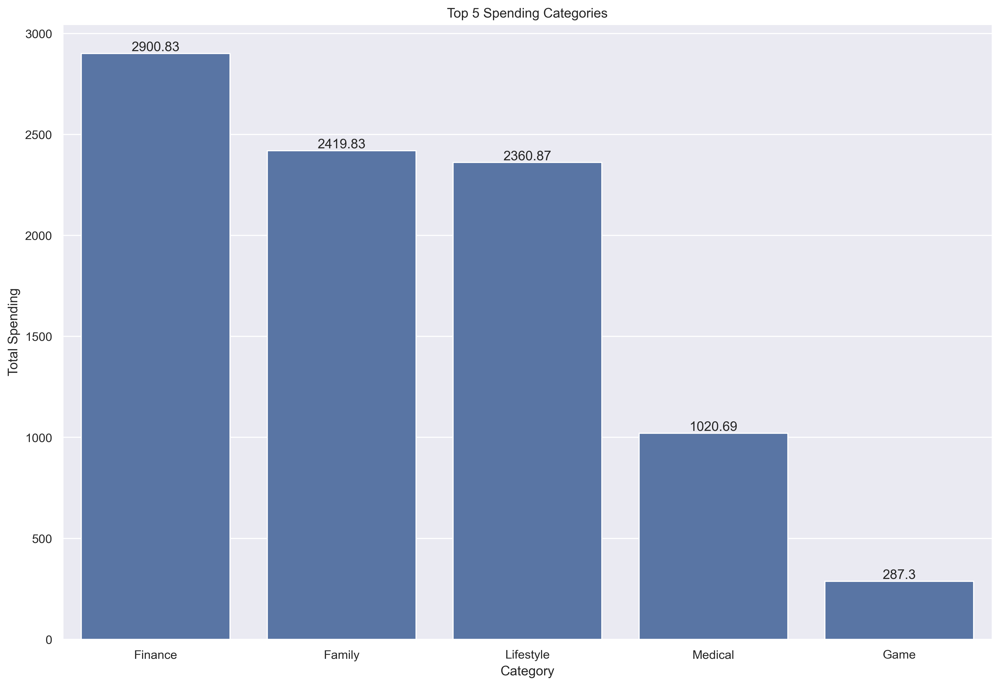

In [190]:
# Bar grafiği çiz
plt.figure(figsize=(15, 10))
ax = sns.barplot(x=top5_categories.index, y=top5_categories.values, order=top5_categories.index)

# Eksen etiketleri ve başlık
plt.xlabel('Category')
plt.ylabel('Total Spending')
plt.title('Top 5 Spending Categories')

for container in ax.containers:
    ax.bar_label(container)

# Göster
plt.show()

## <font color='orange'> <b>Google Play Store Uygulamalarının Adlarında En Yaygın Kelimeler Nelerdir?</b><font color='black'>

Google Play Store'da hangi kelimelerin veya terimlerin sıkça kullanıldığına dair bir fikir edinmek istiyoruz.

**text = ' '.join(df['App'])** ('df') "App" sütununda bulunan tüm uygulama isimlerini birleştiriyoruz. Her bir isim arasına bir boşluk koyarak tek bir büyük metin oluşturuyoruz.

**wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)** oluşturulan büyük metni kullanarak bir kelime bulutu (WordCloud) oluşturuyoruz. Kelime bulutunun boyutlarını (800x400) ve arka plan rengini (beyaz) belirtiyoruz. **generate() metodu,** metinden kelime bulutunu oluşturur.

**plt.figure(figsize=(10, 5))** görselleştirmenin boyutlarını belirtiyoruz. Genişlik 10 birim ve yükseklik 5 birim olacak şekilde ayarlanmıştır.

**plt.imshow(wordcloud, interpolation='bilinear')** kelime bulutunu görüntülemek için **imshow()** fonksiyonunu kullanıyoruz. "bilinear" interpolasyon, görüntünün daha yumuşak görünmesini sağlar.

**plt.axis('off')** grafikteki eksen bilgilerini gizliyoruz. Yani, x ve y eksenindeki etiketler ve rakamlar görüntülenmeyecektir.

**plt.title('Google Play Store Apps Word Cloud')** görselleştirmenin başlığını belirtiyoruz.

**plt.show()** görselleştirmeyi ekrana çizdiriyoruz.

Google Play Store'daki uygulama isimlerinin hangi kelimeleri veya terimleri sıkça kullandığını gösterir.

Sıkça geçen kelimeler daha büyük ve daha belirgin bir şekilde gösterilir.

Bu tür bir görselleştirme genellikle metinde hangi kelimelerin veya terimlerin en yaygın olduğunu hızlı ve etkili bir şekilde görmek için kullanılır. 

- Hangi kelimeler veya terimler uygulama isimlerinde sıkça kullanılıyor?
- Belirli bir kategori veya tür için karakteristik kelimeler veya terimler nelerdir? (Eğer veriyi kategorilere göre filtrelemişseniz)
- Pazarda belirli bir niş veya trend var mı?

Bu tür bir analiz, uygulama geliştiricileri için faydalı olabilir; örneğin, bir uygulama ismi seçerken veya pazardaki rekabeti değerlendirirken.

In [193]:
# pip install wordcloud

In [194]:
from wordcloud import WordCloud

In [195]:
# 'App' sütunundaki tüm uygulama isimlerini bir araya getir
text = ' '.join(df['App'])
text

'Photo Editor & Candy Camera & Grid & ScrapBook Coloring book moana U Launcher Lite – FREE Live Cool Themes, Hide Apps Sketch - Draw & Paint Pixel Draw - Number Art Coloring Book Paper flowers instructions Smoke Effect Photo Maker - Smoke Editor Infinite Painter Garden Coloring Book Kids Paint Free - Drawing Fun Text on Photo - Fonteee Name Art Photo Editor - Focus n Filters Tattoo Name On My Photo Editor Mandala Coloring Book 3D Color Pixel by Number - Sandbox Art Coloring Photo Designer - Write your name with shapes 350 Diy Room Decor Ideas FlipaClip - Cartoon animation ibis Paint X Logo Maker - Small Business Boys Photo Editor - Six Pack & Men\'s Suit Superheroes Wallpapers | 4K Backgrounds Mcqueen Coloring pages HD Mickey Minnie Wallpapers Harley Quinn wallpapers HD Colorfit - Drawing & Coloring Animated Photo Editor Pencil Sketch Drawing Easy Realistic Drawing Tutorial Pink Silver Bow Keyboard Theme Art Drawing Ideas Anime Manga Coloring Book Easy Origami Ideas I Creative Idea How

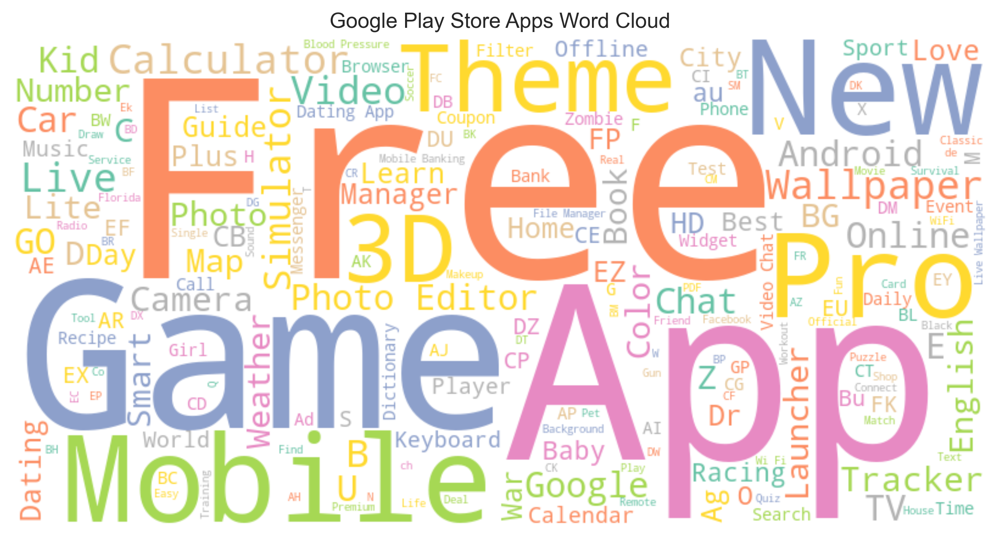

In [228]:
# WordCloud oluştur

wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Set2').generate(text)

# Grafik özelliklerini ayarla
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Google Play Store Apps Word Cloud')
plt.show()

## <font color='orange'> <b>Google Play Store'da Hangi Kategoriler Yüksek Puanlarla Düşük Yüklemeleri Gösteriyor?</b><font color='black'>

1. **Group by 'Category'**: DataFrame df, 'Category' sütununa göre gruplanmıştır. Bu işlem, her benzersiz kategori için verileri toplar.

2. **Aggregate Functions**:
   - 'Rating': 'mean': Her kategori için ortalama kullanıcı puanı hesaplanır. Bu, o kategori içindeki genel kullanıcı memnuniyetini yansıtır.
   - 'Installs': 'sum': Her kategori için uygulama yüklemelerinin toplamı hesaplanır. Bu, o kategorinin genel popülaritesini veya kullanıcı tarafından ne kadar kabul gördüğünü gösterir.

3. **Sort Values**: Elde edilen veriler, önce 'Installs' sütununa göre artan düzende, ardından 'Rating' sütununa göre azalan düzende sıralanır. Bu sıralama, az yüklenme sayısına rağmen yüksek puan alan kategorileri belirlemeye yardımcı olur.

Bu işlemler sonucunda elde edilen bilgiler, düşük rekabet ve yüksek kullanıcı memnuniyeti olan kategorileri belirleyerek, bu kategorilere yeni uygulamalar geliştirmek isteyen geliştiriciler için stratejik fırsatlar sunar.


In [230]:
low_competition_cat = df.groupby('Category')[['Rating', 'Installs']].agg({
    'Rating':
    'mean',
    'Installs':
    'sum'
}).sort_values(['Installs', 'Rating'], ascending=[True, False])

low_competition_cat['Installs'] = round(
    low_competition_cat['Installs'] / 1000000, 2)

low_competition_cat

,Rating,Installs
Category,,
Events,4.395313,15.97
Beauty,4.283019,27.20
Parenting,4.300000,31.52
Medical,4.212990,42.20
Auto and vehicles,4.205882,53.13
Comics,4.160000,56.09
Libraries and demo,4.208333,62.00
Art and design,4.373437,124.33
House and home,4.185000,125.21


1. **Scatter Plot Çizimi**: sns.scatterplot fonksiyonu kullanılarak, 'Rating' (Puan) sütunu x ekseninde ve 'Installs' (Yüklemeler) sütunu y ekseninde olacak şekilde bir scatter plot çizilir. Her kategori farklı bir renk ile temsil edilir ve puan büyüklüğüne göre dairelerin büyüklüğü değişir.

2. **Legend Ayarları**:
   - ax.get_legend_handles_labels(): Mevcut legend'ın handle'ları (kontrol elemanları) ve etiketleri çekilir.
   - ax.legend(...): Legend'ın sadece ilk 11 elemanı gösterilecek şekilde ayarlanır ve büyük boyutlu etiketler gizlenir. Legend, grafiğin dışına ve sağ üst köşeye yerleştirilir.

3. **Gösterim**: plt.show() fonksiyonu ile grafik ekranda gösterilir.

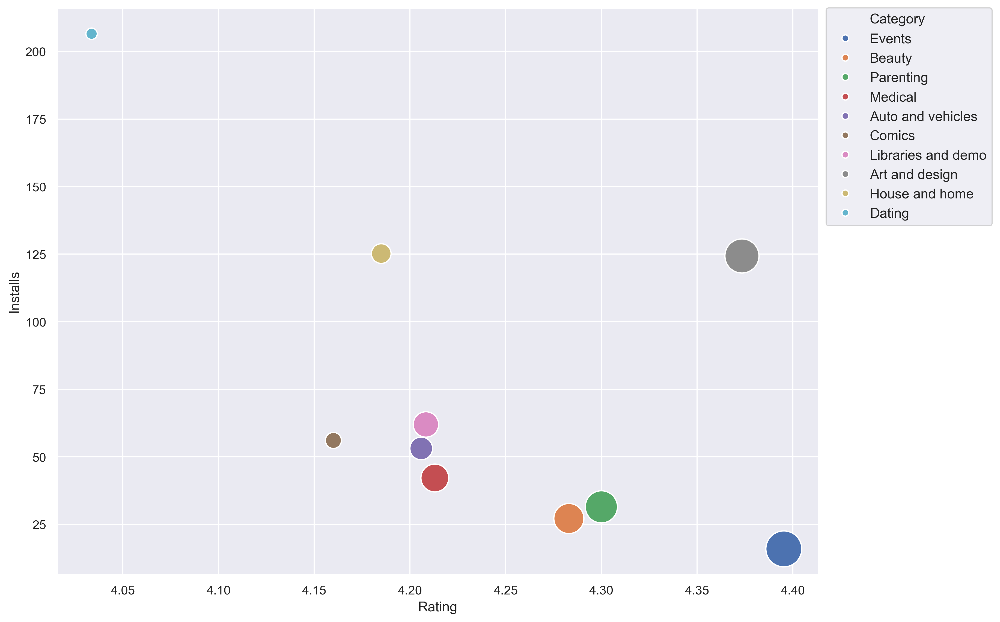

In [232]:
ax = sns.scatterplot(data=low_competition_cat[:10], x='Rating',
                y='Installs', hue='Category', size='Rating', sizes=[s for s in range(100,1200,100)], legend=True)

h, l = ax.get_legend_handles_labels()

ax.legend(h[0:11], l[0:11], bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0., fontsize=12)
plt.show()

## <font color='orange'> <b>Uygulamaların Derecelendirmeleri ile İnceleme Sayısı Arasındaki Korelasyon Ne Kadar Güçlü?</b><font color='black'>

In [234]:
df.groupby('Rating')['Reviews'].sum()

Rating
1.0            28
1.2            44
1.4            98
1.5            61
1.6           691
1.7          2360
1.8          3418
1.9          2828
2.0          2997
2.1          3073
2.2          1979
2.3          2361
2.4         14829
2.5         14807
2.6          3761
2.7         25048
2.8        124730
2.9         57937
3.0        162618
3.1        320836
3.2        228320
3.3       1549019
3.4        958238
3.5       1565333
3.6       1797409
3.7       8646427
3.8      10756081
3.9      13564710
4.0     223602758
4.1     228915549
4.2     192300285
4.3     600892056
4.4     868505306
4.5    1158893777
4.6     675532724
4.7     189812069
4.8      23349249
4.9       2312993
5.0          2384
Name: Reviews, dtype: int64

Correlation coff: 0.06347187197772498


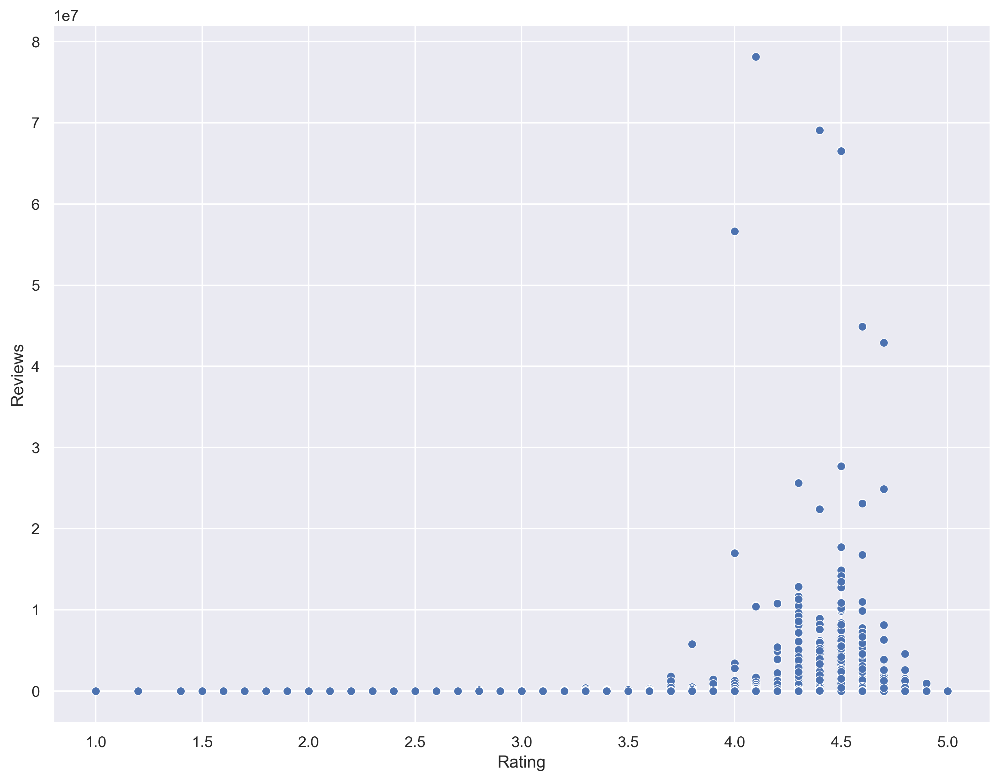

In [235]:
sns.scatterplot(data=df, x='Rating', y='Reviews')

print('Correlation coff:', df['Reviews'].corr(df['Rating']))

Görseldeki "1e7" ifadesi, matematikteki bilimsel notasyonu temsil eder ve \(1 x 10^7\) anlamına gelir.

Bu notasyon, genellikle çok büyük veya çok küçük sayıları daha okunabilir bir formatla göstermek için kullanılır. 

Burada, y ekseninde "Reviews" için kullanılan 1e7, 10.000.000 yorum anlamına gelmektedir.

## <font color='orange'> <b>İçerik Derecelendirmeleri Uygulama Kategorileriyle Nasıl İlişkilidir?</b><font color='black'>

In [238]:
df['Content_Rating'].value_counts()

Content_Rating
Everyone           8372
Teen               1146
Mature 17+          447
Everyone 10+        376
Adults only 18+       3
Unrated               2
Name: count, dtype: int64

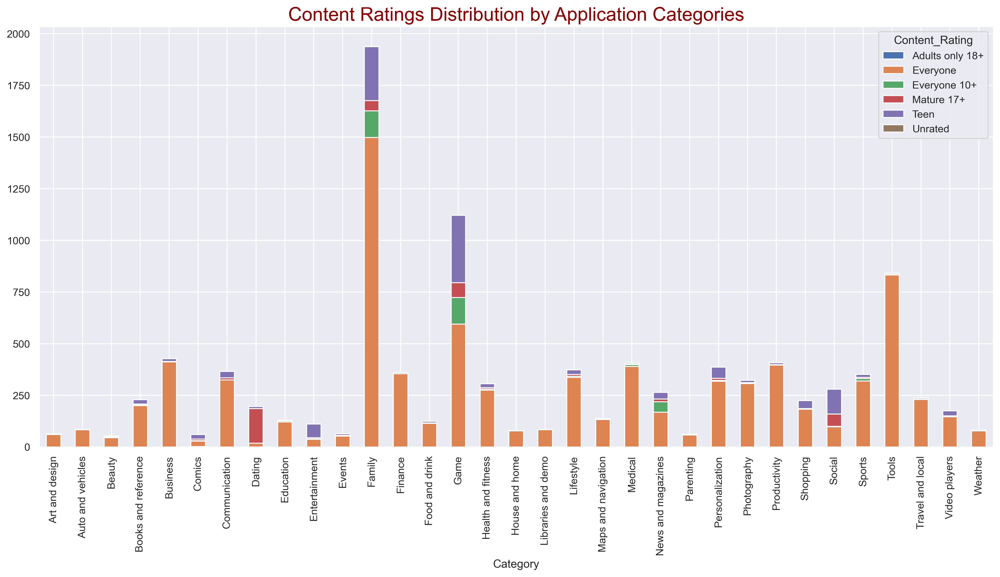

In [239]:
content_category_cross = pd.crosstab( df['Category'], df['Content_Rating'])

content_category_cross.plot(kind='bar', stacked=True, figsize=(18,8))

plt.title("Content Ratings Distribution by Application Categories", fontdict={'fontsize': 20, 'color': 'darkred'});

## <font color='orange'> <b>Uygulama Kurulumları Farklı Android Sürümlerine Göre Nasıl Değişir?</b><font color='black'>

In [241]:
df['Android_Ver'].value_counts()

Android_Ver
4.1 and up            2379
4.0.3 and up          1451
4.0 and up            1335
Varies with device    1220
4.4 and up             894
2.3 and up             642
5.0 and up             546
4.2 and up             386
2.3.3 and up           279
2.2 and up             239
3.0 and up             236
4.3 and up             235
2.1 and up             133
1.6 and up             115
6.0 and up              58
7.0 and up              42
3.2 and up              36
2.0 and up              31
5.1 and up              22
1.5 and up              19
4.4W and up             11
3.1 and up              10
2.0.1 and up             7
8.0 and up               6
7.1 and up               3
4.0.3 - 7.1.1            2
5.0 - 8.0                2
1.0 and up               2
7.0 - 7.1.1              1
4.1 - 7.1.1              1
5.0 - 6.0                1
2.2 - 7.1.1              1
5.0 - 7.1.1              1
Name: count, dtype: int64

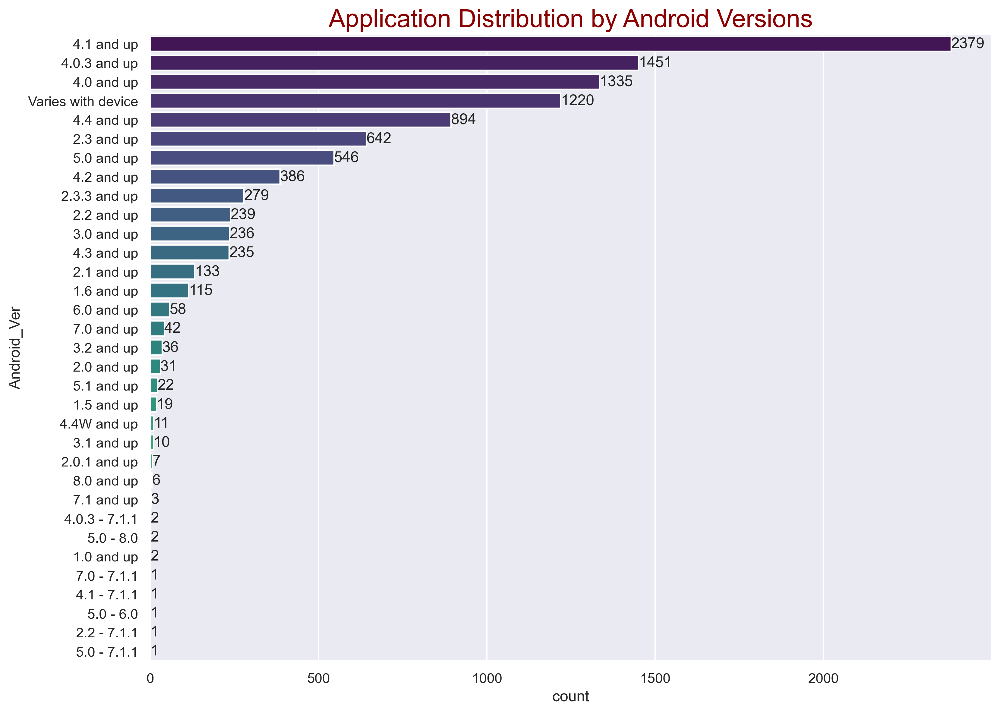

In [256]:
sorted_order = df['Android_Ver'].value_counts().index

ax = sns.countplot(data=df, y='Android_Ver', order=sorted_order, palette='viridis')

plt.title("Application Distribution by Android Versions",
          fontdict={
              'fontsize': 20,
              'color': 'darkred'
          })

for container in ax.containers:
    ax.bar_label(container)